## Prepare

In [1]:
import os
import sys
from datetime import datetime

import fitz
import folium
import geopandas as gpd
import pdfkit
import pandas as pd
from functools import partial
import seaborn as sns
from folium.plugins import HeatMap
from matplotlib import pyplot as plt

%load_ext autoreload
%autoreload 2
import sys

sys.path.append("../src/")
from package import strtime
from package.geometa import GeoMeta
from package.h3 import (
    plot_h3_cells_on_folium,
)
from package.logger import setup
from package.h3 import plot_h3_cells_discrete_colors_on_folium

setup("INFO")

In [2]:
city = "cologne"
date = "20240423"

In [3]:
geo_meta_path = "../data/stateful_variables/" + city.lower() + "_geometa.pkl"
experiment_path = "../data/mcr5/" + city.lower() + "_" + date + "/"
profiles_tariffs_path = experiment_path + "profiles-tariffs.feather"
profiles_categories_path = experiment_path + "profiles-categories-tariffs.feather"


geo_meta = GeoMeta.load(geo_meta_path)

## Other substitional data

In [4]:
# zones = gpd.read_file(
#     "../data/zones.csv", GEOM_POSSIBLE_NAMES="geometry", KEEP_GEOM_COLUMNS="NO"
# )
# zones["valid_from"] = pd.to_datetime(zones["valid_from"])
# zones["valid_till"] = pd.to_datetime(zones["valid_till"])

# color_map = {
#     "chargeable_return": "red",
#     "free_return": "green",
# }


# def plot_zones(m: folium.Map, zones: gpd.GeoDataFrame, time: datetime):
#     zones = zones[(zones["valid_from"] <= time) & (zones["valid_till"] >= time)]
#     # zones = zones[zones["category"] == "free_return"]
#     zones = zones.sort_values("category")
#     print(f"plotting {len(zones)} zones")
#     for _, zone in zones.iterrows():
#         print(color_map[zone["category"]])
#         folium.GeoJson(
#             zone.geometry,
#             name=zone["name"],
#             style_function=lambda x: {
#                 "color": "black",
#                 "fillOpacity": 0.5,
#                 "fillColor": color_map[zone["category"]],
#             },
#         ).add_to(m)

In [5]:
# from package import storage

# bicycle_location_paths = [
#     entry.path for entry in os.scandir("../data/bicycle_locations") if entry.is_file()
# ]

# bicycle_locations_dict = {}

# for bicycle_location_path in bicycle_location_paths:
#     bicycle_locations = storage.read_df(bicycle_location_path)
#     bicycle_locations = gpd.GeoDataFrame(
#         bicycle_locations,
#         geometry=gpd.points_from_xy(
#             bicycle_locations.lon,
#             bicycle_locations.lat,
#         ),
#     )
#     bicycle_locations_dict[bicycle_location_path] = bicycle_locations

# all_bicycle_locations = pd.concat(bicycle_locations_dict.values())


# def plot_bicycle_locations(
#     m: folium.Map,
#     bicycle_locations: gpd.GeoDataFrame,
#     as_heatmap: bool = False,
#     color="orange",
# ):
#     if as_heatmap:
#         HeatMap(
#             data=bicycle_locations[["lat", "lon"]].to_numpy().tolist(),
#             radius=5,
#             blur=5,
#         ).add_to(m)
#     else:
#         for _, bicycle_location in bicycle_locations.iterrows():
#             folium.CircleMarker(
#                 location=(bicycle_location.geometry.y, bicycle_location.geometry.x),
#                 popup="bicycle",
#                 radius=6,
#                 weight=1,
#                 color="black",
#                 fill=True,
#                 fillColor=color,
#                 opacity=1,
#                 fillOpacity=1,
#             ).add_to(m)

In [6]:
# stops = storage.read_gdf("../data/cleaned/stops.csv")


# def plot_stops(m: folium.Map, stops: gpd.GeoDataFrame, color="yellow"):
#     for _, stop in stops.iterrows():
#         folium.CircleMarker(
#             location=(stop.geometry.y, stop.geometry.x),
#             popup="stop",
#             radius=6,
#             weight=1,
#             color="black",
#             fill=True,
#             fillColor=color,
#             fillOpacity=1,
#             opacity=1,
#         ).add_to(m)

## Results

In [7]:
# profiles_df = pd.read_feather("../data/mcr5/Koeln-profiles.feather")
# profiles_df_categories = pd.read_feather(
#    "../data/mcr5/Koeln-profiles-categories.feather"
# )
profiles_df_tariffs = pd.read_feather(profiles_tariffs_path)
profiles_df_categories_tariffs = pd.read_feather(profiles_categories_path)

In [8]:
scenario_labels = {
    "bicycle_public_transport": "Combined",
    "bicycle": "Bicycle",
    "public_transport": "Public Transport",
    "walking": "Walking",
    "car": "Car",
}


def replace_occurences(old: str):
    for key, value in scenario_labels.items():
        old = old.replace(key, value)
    return old


profiles_df_tariffs["scenario"] = profiles_df_tariffs.scenario.apply(replace_occurences)
profiles_df_tariffs["core_scenario"] = profiles_df_tariffs.core_scenario.apply(
    replace_occurences
)
profiles_df_categories_tariffs["scenario"] = (
    profiles_df_categories_tariffs.scenario.apply(replace_occurences)
)
profiles_df_categories_tariffs["core_scenario"] = (
    profiles_df_categories_tariffs.core_scenario.apply(replace_occurences)
)

In [9]:
# drop those hexagons, where one scenario failed
n_scenarios = profiles_df_tariffs["scenario"].nunique()
all_hex_ids = profiles_df_tariffs.groupby(["hex_id"]).size() == n_scenarios
all_hex_ids = all_hex_ids[all_hex_ids].index.values
profiles_df = profiles_df_tariffs[profiles_df_tariffs.index.isin(all_hex_ids)]


n_scenarios_categories = profiles_df_categories_tariffs["scenario"].nunique()
all_hex_ids = (
    profiles_df_categories_tariffs.groupby(["hex_id", "category"]).size()
    == n_scenarios_categories
)
all_hex_ids = [hex_id for hex_id, _ in all_hex_ids[all_hex_ids].index.values]
profiles_df_categories = profiles_df_categories_tariffs[
    profiles_df_categories_tariffs.index.isin(all_hex_ids)
]

In [10]:
core_scenarios_to_check = ["Bicycle", "Combined", "Public Transport", "Walking"]

# Filter rows where core_scenario is in the list of core scenarios to check
filtered_df = profiles_df_tariffs[
    profiles_df_tariffs["core_scenario"].isin(core_scenarios_to_check)
]

# Create a boolean mask to identify rows where cost_0 is not equal for the same hex_id and category
mask = filtered_df.groupby(["hex_id"])["cost_0"].transform("nunique") == 1

# Filter rows based on the mask
result = filtered_df[mask]

# the result should be 1
result.shape[0] / filtered_df.shape[0]

0.8405418209253768

In [11]:
profiles_df_tariffs_unaggregated = profiles_df_tariffs.copy()

In [12]:
profiles_df_tariffs = (
    profiles_df_tariffs_unaggregated.drop(columns=["scenario"])
    .groupby(["core_scenario", "hex_id"])
    .mean()
    .reset_index(level=0)
    .rename(columns={"core_scenario": "scenario"})
)

In [13]:
uncertain_scenarios = ["Public Transport", "Bicycle", "Combined"]

profiles_std_df = (
    profiles_df_tariffs_unaggregated.drop(columns=["scenario"])[
        profiles_df_tariffs_unaggregated["core_scenario"].isin(uncertain_scenarios)
    ]
    .groupby(["core_scenario", "hex_id"])
    .std()
    .reset_index(level=0)
    .rename(columns={"core_scenario": "scenario"})
)

In [14]:
profiles_df_unaggregated_reset = profiles_df_tariffs_unaggregated.reset_index()
best = (
    profiles_df_unaggregated_reset.drop(columns=["scenario"])
    .groupby(["core_scenario", "hex_id"])["optimal"]
    .idxmin()
)
worst = (
    profiles_df_unaggregated_reset.drop(columns=["scenario"])
    .groupby(["core_scenario", "hex_id"])["optimal"]
    .idxmax()
)
profiles_best_case_df = profiles_df_unaggregated_reset.loc[best]
profiles_worst_case_df = profiles_df_unaggregated_reset.loc[worst]

profiles_best_case_df.head()

,hex_id,any_column_different,required_cost_for_optimal,optimal,scenario,required_cost_for_optimal_in_euro,optimal_in_minutes,cost_0,cost_19,cost_38,...,cost_95,cost_100,cost_114,cost_133,cost_152,cost_200,cost_220,cost_320,cost_420,core_scenario
3564,891fa181003ffff,False,0,720.0,Bicycle_3,0.0,12.0,720.0,720.0,720.0,...,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,Bicycle
3565,891fa181007ffff,False,0,960.0,Bicycle_3,0.0,16.0,960.0,960.0,960.0,...,960.0,960.0,960.0,960.0,960.0,960.0,960.0,960.0,960.0,Bicycle
3566,891fa18100bffff,False,0,720.0,Bicycle_3,0.0,12.0,720.0,720.0,720.0,...,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,Bicycle
3567,891fa18100fffff,False,0,900.0,Bicycle_3,0.0,15.0,900.0,900.0,900.0,...,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,Bicycle
3568,891fa181013ffff,False,0,660.0,Bicycle_3,0.0,11.0,660.0,660.0,660.0,...,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0,Bicycle


# Results

### Required cost tables

Profiles mean

In [15]:
required_cost_description = profiles_df_tariffs.groupby("scenario")[
    "required_cost_for_optimal_in_euro"
].describe()
required_cost_description = required_cost_description[
    ["mean", "25%", "50%", "75%", "max"]
]
required_cost_description_style = required_cost_description.style.format(precision=2)
print(required_cost_description_style.to_latex())
required_cost_description

\begin{tabular}{lrrrrr}
 & mean & 25% & 50% & 75% & max \\
scenario &  &  &  &  &  \\
Bicycle & 0.47 & 0.00 & 0.57 & 0.86 & 1.14 \\
Car & 0.37 & 0.19 & 0.38 & 0.38 & 1.33 \\
Combined & 0.93 & 0.29 & 0.86 & 1.17 & 3.77 \\
Public Transport & 0.68 & 0.00 & 0.00 & 2.13 & 3.20 \\
Walking & 0.00 & 0.00 & 0.00 & 0.00 & 0.00 \\
\end{tabular}



,mean,25%,50%,75%,max
scenario,,,,,
Bicycle,0.471781,0.000000,0.571429,0.857143,1.142857
Car,0.370511,0.190000,0.380000,0.380000,1.330000
Combined,0.928919,0.285714,0.857143,1.171429,3.771429
Public Transport,0.680696,0.000000,0.000000,2.133333,3.200000
Walking,0.000000,0.000000,0.000000,0.000000,0.000000


Profiles best case

In [16]:
required_cost_description = profiles_best_case_df.groupby("core_scenario")[
    "required_cost_for_optimal_in_euro"
].describe()
required_cost_description = required_cost_description[
    ["mean", "25%", "50%", "75%", "max"]
]
required_cost_description_style = required_cost_description.style.format(precision=2)
# print(required_cost_description_style.to_latex())
required_cost_description

,mean,25%,50%,75%,max
core_scenario,,,,,
Bicycle,0.649832,0.00,1.00,1.00,2.00
Car,0.370511,0.19,0.38,0.38,1.33
Combined,1.097306,1.00,1.00,1.00,4.20
Public Transport,0.771156,0.00,0.00,2.20,3.20
Walking,0.000000,0.00,0.00,0.00,0.00


Profiles worst case

In [17]:
required_cost_description = profiles_worst_case_df.groupby("core_scenario")[
    "required_cost_for_optimal_in_euro"
].describe()
required_cost_description = required_cost_description[
    ["mean", "25%", "50%", "75%", "max"]
]
required_cost_description_style = required_cost_description.style.format(precision=2)
# print(required_cost_description_style.to_latex())
required_cost_description

,mean,25%,50%,75%,max
core_scenario,,,,,
Bicycle,0.089787,0.00,0.00,0.00,1.00
Car,0.370511,0.19,0.38,0.38,1.33
Combined,0.600112,0.00,0.00,1.00,3.20
Public Transport,0.574860,0.00,0.00,0.00,3.20
Walking,0.000000,0.00,0.00,0.00,0.00


### Optimal tables

Profiles mean

In [18]:
from datetime import timedelta


def timedelta_formatter(x):
    td = timedelta(minutes=x)
    minutes = td.seconds // 60
    seconds = td.seconds % 60
    return f"{minutes}m {seconds:02d}s"


# timedelta_formatter = lambda x: timedelta(minutes=x)

In [19]:
optimal_description = profiles_df_tariffs.groupby("scenario")[
    "optimal_in_minutes"
].describe()
optimal_description = optimal_description[["mean", "25%", "50%", "75%"]]
optimal_description_style = optimal_description.style.format(timedelta_formatter)
print(optimal_description_style.to_latex())
optimal_description

\begin{tabular}{lrrrr}
 & mean & 25% & 50% & 75% \\
scenario &  &  &  &  \\
Bicycle & 12m 20s & 7m 00s & 10m 25s & 15m 17s \\
Car & 3m 15s & 2m 15s & 3m 00s & 4m 00s \\
Combined & 11m 25s & 7m 00s & 10m 08s & 14m 25s \\
Public Transport & 12m 55s & 9m 00s & 12m 00s & 16m 00s \\
Walking & 14m 22s & 9m 00s & 12m 00s & 18m 00s \\
\end{tabular}



,mean,25%,50%,75%
scenario,,,,
Bicycle,12.344156,7.00,10.428571,15.285714
Car,3.251964,2.25,3.000000,4.000000
Combined,11.431725,7.00,10.142857,14.416667
Public Transport,12.917321,9.00,12.000000,16.000000
Walking,14.375214,9.00,12.000000,18.000000


In [20]:
optimal_std_description = profiles_std_df.groupby("scenario")[
    "optimal_in_minutes"
].describe()
optimal_std_description = optimal_std_description[
    ["mean", "min", "25%", "50%", "75%", "max"]
]
optimal_std_description_style = optimal_std_description.style.format(
    timedelta_formatter
)
optimal_std_description["CV"] = (
    optimal_std_description["mean"]
    / optimal_description.drop(index=["Car", "Walking"])["mean"]
)
print(optimal_std_description_style.to_latex())
optimal_std_description

\begin{tabular}{lrrrrrrr}
 & mean & min & 25% & 50% & 75% & max & CV \\
scenario &  &  &  &  &  &  &  \\
Bicycle & 1m 07s & 0m 00s & 0m 00s & 0m 47s & 1m 36s & 9m 49s & 0.090841 \\
Combined & 0m 56s & 0m 00s & 0m 00s & 0m 52s & 1m 26s & 6m 25s & 0.082884 \\
Public Transport & 0m 15s & 0m 00s & 0m 00s & 0m 00s & 0m 00s & 8m 39s & 0.019810 \\
\end{tabular}



,mean,min,25%,50%,75%,max,CV
scenario,,,,,,,
Bicycle,1.121356,0.0,0.0,0.786796,1.603567,9.827076,0.090841
Combined,0.947505,0.0,0.0,0.872872,1.434274,6.428730,0.082884
Public Transport,0.255893,0.0,0.0,0.000000,0.000000,8.660254,0.019810


Profiles best case

In [21]:
optimal_description_best = profiles_best_case_df.groupby("core_scenario")[
    "optimal_in_minutes"
].describe()
optimal_description_best = optimal_description_best[["mean", "25%", "50%", "75%"]]
optimal_description_style = optimal_description_best.style.format(timedelta_formatter)
# print(optimal_description_style.to_latex())
optimal_description_best

,mean,25%,50%,75%
core_scenario,,,,
Bicycle,11.319865,6.00,10.0,15.0
Car,3.251964,2.25,3.0,4.0
Combined,10.440516,6.00,10.0,14.0
Public Transport,12.704826,9.00,12.0,16.0
Walking,14.375214,9.00,12.0,18.0


Profiles worst case

In [22]:
optimal_description_worst = profiles_worst_case_df.groupby("core_scenario")[
    "optimal_in_minutes"
].describe()
optimal_description_worst = optimal_description_worst[["mean", "25%", "50%", "75%"]]
optimal_description_style = optimal_description_worst.style.format(timedelta_formatter)
# print(optimal_description_style.to_latex())
optimal_description_worst

,mean,25%,50%,75%
core_scenario,,,,
Bicycle,14.185185,9.00,12.0,17.00
Car,3.251964,2.25,3.0,4.00
Combined,12.977553,9.00,12.0,16.00
Public Transport,13.156566,9.00,12.0,16.75
Walking,14.375214,9.00,12.0,18.00


best vs worst case

In [23]:
optimal_diff = optimal_description_worst - optimal_description_best
optimal_diff_style = optimal_diff.style.format(timedelta_formatter)
# print(optimal_diff_style.to_latex())
optimal_diff

,mean,25%,50%,75%
core_scenario,,,,
Bicycle,2.865320,3.0,2.0,2.00
Car,0.000000,0.0,0.0,0.00
Combined,2.537037,3.0,2.0,2.00
Public Transport,0.451740,0.0,0.0,0.75
Walking,0.000000,0.0,0.0,0.00


### Differences in optimals

In [24]:
def format_minutes_diff(diff: float):
    minutes = int(diff)
    seconds = int((diff - minutes) * 60)
    return f"{minutes:02d}m {seconds:02d}s"

In [25]:
print(
    format_minutes_diff(
        optimal_description.loc["Walking", "mean"]
        - optimal_description.loc["Public Transport", "mean"]
    )
)

01m 27s


In [26]:
print(
    format_minutes_diff(
        optimal_description.loc["Walking", "mean"]
        - optimal_description.loc["Bicycle", "mean"]
    )
)

02m 01s


In [27]:
print(
    format_minutes_diff(
        optimal_description.loc["Bicycle", "mean"]
        - optimal_description.loc["Combined", "mean"]
    )
)

00m 54s


In [28]:
print(
    format_minutes_diff(
        optimal_description.loc["Public Transport", "mean"]
        - optimal_description.loc["Combined", "mean"]
    )
)

01m 29s


### Plotting distributions

In [29]:
import scienceplots

plt.style.use(["science", "grid", "ieee"])
plt.rcParams.update({"font.size": 20})


def plot_sorted_grouped_data(df, group_column, value_column, ax, color_map=None):
    grouped = df.sort_values(value_column).groupby(group_column)[value_column]

    group_sizes = grouped.size()
    group_size = group_sizes.iloc[0]

    colors = plt.cm.tab10.colors[: len(grouped)]

    for color, (scenario_name, group_data) in zip(colors, grouped):
        if scenario_name in color_map:
            color = color_map[scenario_name]
        group_data.plot(
            kind="line", ax=ax, color=color, linewidth=2, label=scenario_name
        )

    ax.legend()
    ax.set_xlim(0, group_size)
    ax.set_xticks(
        [0, 0.25 * group_size, 0.5 * group_size, 0.75 * group_size, group_size],
        ["0", "25%", "50%", "75%", "100%"],
    )

In [30]:
import pathlib

image_path = f"../figures/mcr5/{city}_{date}"
pathlib.Path(image_path).mkdir(parents=True, exist_ok=True)

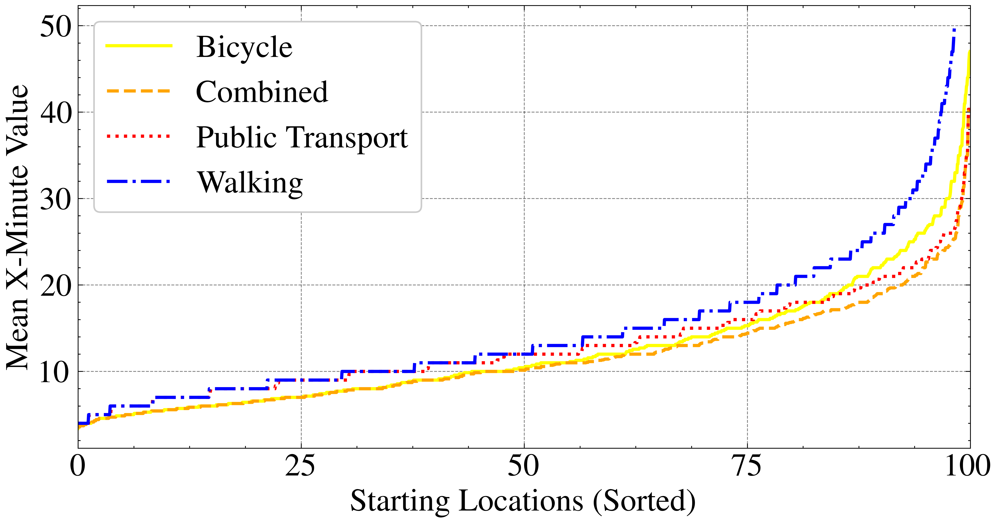

In [31]:
fig, ax = plt.subplots(figsize=(10, 5))
plot_sorted_grouped_data(
    profiles_df_tariffs[profiles_df_tariffs.scenario != "Car"],
    "scenario",
    "optimal_in_minutes",
    ax,
    color_map={
        "Walking": "blue",
        "Bicycle": "yellow",
        "Public Transport": "red",
        "Combined": "orange",
    },
)
# ax.set_title("Best X-Minute-City for each Hexagon")
ax.set_ylabel("Mean X-Minute Value")
ax.set_xlabel("Starting Locations (Sorted)")

plt.savefig(f"{image_path}/best_x_minute_city.png", dpi=300, bbox_inches="tight")

plt.show()

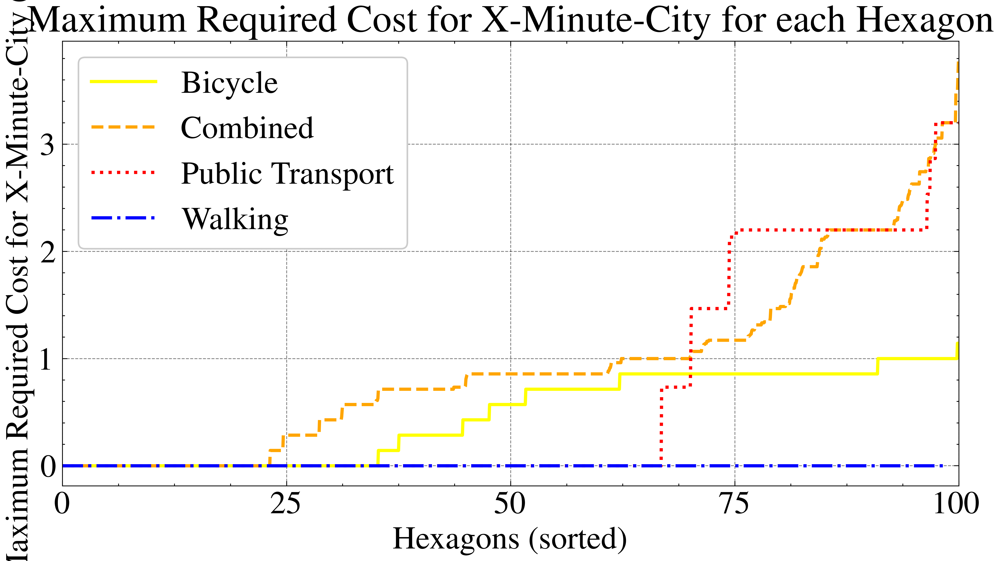

In [32]:
fig, ax = plt.subplots(figsize=(10, 5))
plot_sorted_grouped_data(
    profiles_df_tariffs[profiles_df_tariffs.scenario != "Car"],
    "scenario",
    "required_cost_for_optimal_in_euro",
    ax,
    color_map={
        "Walking": "blue",
        "Bicycle": "yellow",
        "Public Transport": "red",
        "Combined": "orange",
    },
)
ax.set_title("Maximum Required Cost for X-Minute-City for each Hexagon")
ax.set_ylabel("Maximum Required Cost for X-Minute-City (€))")
ax.set_xlabel("Hexagons (sorted)")

plt.savefig(
    f"{image_path}/maximum_required_cost_for_x_minute_city.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

### Differences in subscenarios

In [33]:
import matplotlib.pyplot as plt


def plot_difference_in_subscenario(scenario_df, scenario_title, ax):
    if not ax:
        fig, ax = plt.subplots(figsize=(10, 5))
    scenario_df.groupby("hex_id")["optimal_in_minutes"].min().sort_values().plot(ax=ax)
    scenario_df.groupby("hex_id")["optimal_in_minutes"].max().sort_values().plot(ax=ax)
    print(
        scenario_df.groupby("hex_id")["optimal_in_minutes"].max().mean()
        - scenario_df.groupby("hex_id")["optimal_in_minutes"].min().mean()
    )

    ax.set_title(scenario_title)
    ax.set_ylabel("Time (Minutes)")
    ax.set_xlabel("Hexagons (Sorted)")

    ax.set_xlim(
        0, len(scenario_df.groupby("hex_id")["optimal_in_minutes"].min().sort_values())
    )
    ax.axhline(15, color="red", linestyle="--")
    ax.set_xticks([])

0.4517396184062843
2.865319865319865
2.537037037037038


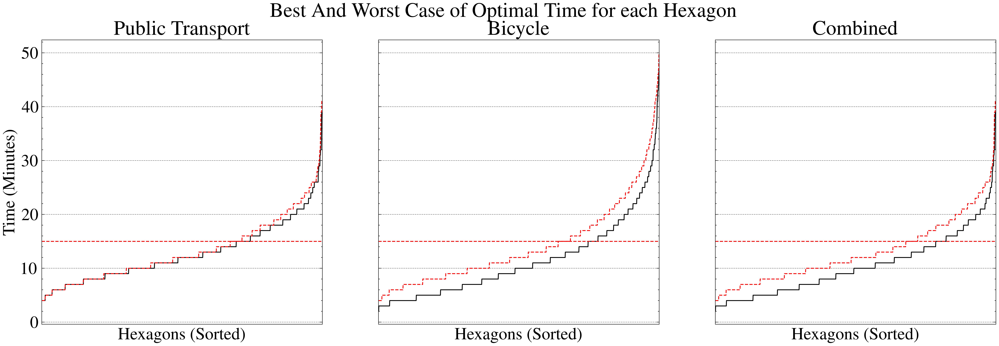

In [34]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

public_transport_profiles_df = profiles_df_tariffs_unaggregated[
    profiles_df_tariffs_unaggregated["core_scenario"] == "Public Transport"
]
plot_difference_in_subscenario(
    public_transport_profiles_df, "Public Transport", axes[0]
)

bicycle_profiles_df = profiles_df_tariffs_unaggregated[
    profiles_df_tariffs_unaggregated["core_scenario"] == "Bicycle"
]
plot_difference_in_subscenario(bicycle_profiles_df, "Bicycle", axes[1])

bicycle_pt_profiles_df = profiles_df_tariffs_unaggregated[
    profiles_df_tariffs_unaggregated["core_scenario"] == "Combined"
]
plot_difference_in_subscenario(bicycle_pt_profiles_df, "Combined", axes[2])

fig.suptitle("Best And Worst Case of Optimal Time for each Hexagon")

plt.savefig(
    f"{image_path}/optimal_best_worst_case.png",
    dpi=300,
    bbox_inches="tight",
)

### Value-Cost profiles for each scenario

In [35]:
cost_columns = [col for col in profiles_df.columns if col.startswith("cost_")]
cost_columns_tariffs = [
    col for col in profiles_df_tariffs.columns if col.startswith("cost_")
]

In [36]:
import numpy as np

no_inf_profiles_df = profiles_df_tariffs[
    np.isinf(profiles_df_tariffs[cost_columns_tariffs]).sum(axis=1) == 0
]

In [37]:
def get_aggregated_cost_per_scenario(profiles_df, cost_columns, aggregation_metric):
    aggregated_per_cost_per_scenario = profiles_df.groupby("scenario")[
        cost_columns
    ].agg(aggregation_metric)
    aggregated_per_cost_per_scenario.columns = [
        int(column.split("_")[1]) for column in aggregated_per_cost_per_scenario.columns
    ]
    aggregated_per_cost_per_scenario = aggregated_per_cost_per_scenario.T

    maximum_time = aggregated_per_cost_per_scenario.max(numeric_only=True).max()

    aggregated_per_cost_per_scenario = aggregated_per_cost_per_scenario / 60
    aggregated_per_cost_per_scenario.index = (
        aggregated_per_cost_per_scenario.index / 100
    )

    return aggregated_per_cost_per_scenario, maximum_time

In [38]:
no_inf_profiles_df.groupby("scenario")[cost_columns].mean()

,cost_0,cost_19,cost_38,cost_57,cost_76,cost_95,cost_100,cost_114,cost_133,cost_152,cost_200,cost_220,cost_320,cost_420
scenario,,,,,,,,,,,,,,
Bicycle,865.396825,865.396825,865.396825,865.396825,865.396825,865.396825,740.678211,740.678211,740.678211,740.678211,740.649351,740.649351,740.649351,740.649351
Car,859.988591,462.338848,284.632059,224.940103,201.768397,196.052481,196.052481,194.033086,194.033086,194.033086,194.033086,194.033086,194.033086,194.033086
Combined,865.396825,865.396825,865.396825,865.396825,865.396825,865.396825,740.678211,740.678211,740.678211,740.678211,740.649351,694.771525,686.108706,685.903479
Public Transport,865.454545,865.454545,865.454545,865.454545,865.454545,865.454545,865.454545,865.454545,865.454545,865.454545,865.454545,782.558923,775.039282,775.039282
Walking,862.512850,862.512850,862.512850,862.512850,862.512850,862.512850,862.512850,862.512850,862.512850,862.512850,862.512850,862.512850,862.512850,862.512850


In [39]:
mean_per_cost_per_scenario, maximum_time = get_aggregated_cost_per_scenario(
    no_inf_profiles_df, cost_columns, "mean"
)

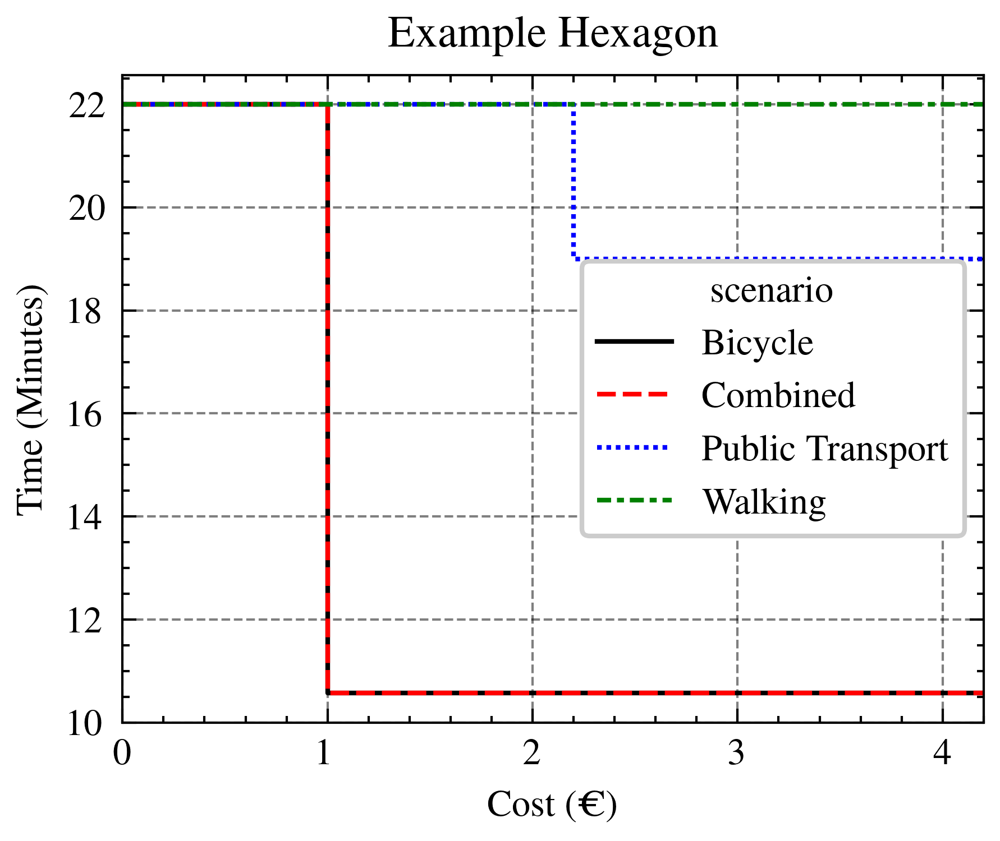

In [40]:
plt.rcParams.update({"font.size": 8})
example_hex = (
    no_inf_profiles_df.loc["891fa18b083ffff"][cost_columns + ["scenario"]]
    .rename(columns=lambda x: int(x.split("_")[1]) if x.startswith("cost_") else x)
    .set_index("scenario")
    .T
    / 60
)
example_hex.index = example_hex.index.astype(int) / 100
example_hex = example_hex.drop(columns=["Car"])

ax = sns.lineplot(example_hex, drawstyle="steps-post")
ax.set_xlim(0, example_hex.index.max())
ax.set_title("Example Hexagon")
ax.set_ylabel("Time (Minutes)")
ax.set_xlabel("Cost (€)")

plt.savefig(f"{image_path}/example_profile.png", dpi=300, bbox_inches="tight")

plt.show()

In [41]:
def calculate_diffs(profile):
    costs = list(profile.index)
    prev_best_cost = 0
    diffs = []

    for cost, time in profile.items():
        prev_cost_index = costs.index(cost) - 1
        if prev_cost_index < 0:
            continue
        prev_cost = costs[prev_cost_index]
        prev_time = profile[prev_cost]

        if prev_time > time:
            euro_per_minute = (cost - prev_best_cost) / (prev_time - time)
            minute_per_euro = (prev_time - time) / (cost - prev_best_cost)

            diffs.append(
                {
                    "improvement": prev_time - time,
                    "at_cost": cost,
                    "for_time": time,
                    "cost_diff": cost - prev_best_cost,
                    "minute_per_euro": minute_per_euro,
                    "euro_per_minute": euro_per_minute,
                }
            )

            prev_best_cost = cost
    diffs_df = pd.DataFrame(diffs)
    return diffs_df

In [42]:
def pretty_print_latex(df, precision=2):
    df = df.copy()
    df.columns = [col.replace("_", " ") for col in df.columns]

    def replace_underscore(cell):
        # Replace underscores with spaces if the cell is a string
        if isinstance(cell, str):
            return cell.replace("_", " ")
        return cell

    df = df.applymap(replace_underscore)
    style = df.style.format(precision=precision).format_index("")

    print(style.to_latex())

In [43]:
def calculate_all_diffs(profiles_df):
    diffs_dfs = []
    for col in profiles_df.columns:
        diffs_df = calculate_diffs(profiles_df[col])
        diffs_df["scenario"] = col
        diffs_dfs.append(diffs_df)
    return pd.concat(diffs_dfs)

In [44]:
diffs_df = calculate_all_diffs(example_hex)
pretty_print_latex(diffs_df[["improvement", "at_cost", "minute_per_euro", "scenario"]])
diffs_df

\begin{tabular}{lrrrl}
 & improvement & at cost & minute per euro & scenario \\
 & 11.43 & 1.00 & 11.43 & Bicycle \\
 & 11.43 & 1.00 & 11.43 & Combined \\
 & 3.00 & 2.20 & 1.36 & Public Transport \\
\end{tabular}



/tmp/ipykernel_31429/713530145.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(replace_underscore)


,improvement,at_cost,for_time,cost_diff,minute_per_euro,euro_per_minute,scenario
0,11.428571,1.0,10.571429,1.0,11.428571,0.087500,Bicycle
0,11.428571,1.0,10.571429,1.0,11.428571,0.087500,Combined
0,3.000000,2.2,19.000000,2.2,1.363636,0.733333,Public Transport


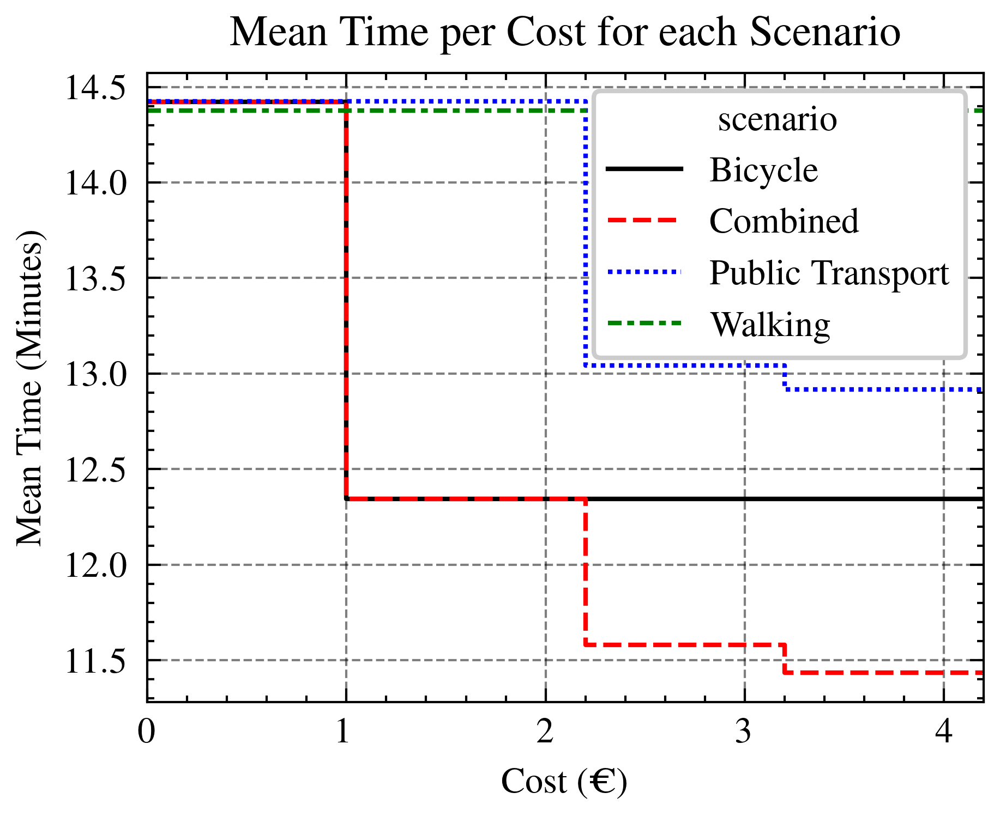

In [45]:
ax = sns.lineplot(
    data=mean_per_cost_per_scenario[
        [
            scenario
            for scenario in mean_per_cost_per_scenario.columns
            if scenario != "Car"
        ]
    ],
    drawstyle="steps-post",
)
ax.set_xlim(0, mean_per_cost_per_scenario.index.max())
# ax.set_ylim(0,maximum_time+100)
ax.set_title("Mean Time per Cost for each Scenario")
ax.set_ylabel("Mean Time (Minutes)")
ax.set_xlabel("Cost (€)")

plt.savefig(
    f"{image_path}/mean_time_per_cost_for_each_scenario.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

Zeitgewinn pro Kosten leich ablesbar

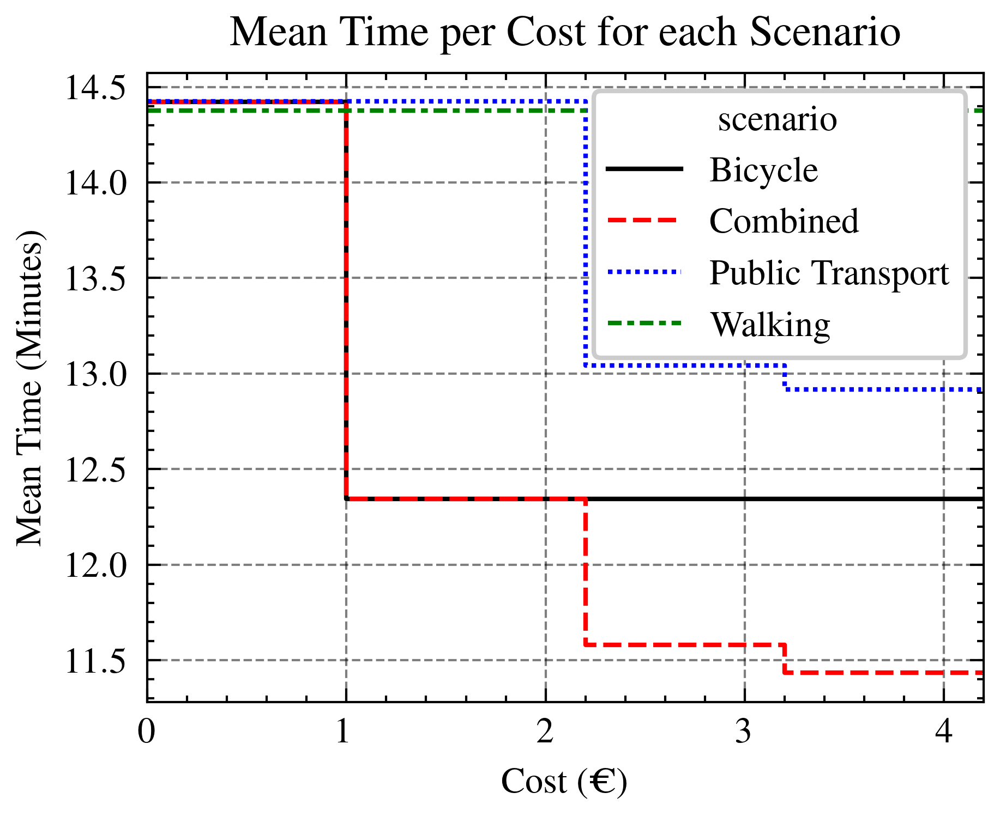

In [46]:
ax = sns.lineplot(
    data=mean_per_cost_per_scenario.drop(columns="Car"), drawstyle="steps-post"
)
ax.set_xlim(0, mean_per_cost_per_scenario.index.max())
ax.set_title("Mean Time per Cost for each Scenario")
ax.set_ylabel("Mean Time (Minutes)")
ax.set_xlabel("Cost (€)")


plt.savefig(
    f"{image_path}/mean_time_per_cost_for_each_scenario_without_car.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

In [47]:
diffs_df = calculate_all_diffs(
    mean_per_cost_per_scenario.drop(columns=["Car", "Combined"])
)
pretty_print_latex(
    diffs_df[
        ["improvement", "at_cost", "cost_diff", "minute_per_euro", "scenario"]
    ].sort_values("improvement", ascending=False),
    precision=3,
)
diffs_df

\begin{tabular}{lrrrrl}
 & improvement & at cost & cost diff & minute per euro & scenario \\
 & 2.079 & 1.000 & 1.000 & 2.079 & Bicycle \\
 & 1.382 & 2.200 & 2.200 & 0.628 & Public Transport \\
 & 0.125 & 3.200 & 1.000 & 0.125 & Public Transport \\
 & 0.000 & 2.000 & 1.000 & 0.000 & Bicycle \\
\end{tabular}



/tmp/ipykernel_31429/713530145.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(replace_underscore)


,improvement,at_cost,for_time,cost_diff,minute_per_euro,euro_per_minute,scenario
0,2.078644,1.0,12.344637,1.0,2.078644,0.481083,Bicycle
1,0.000481,2.0,12.344156,1.0,0.000481,2079.000000,Bicycle
0,1.381594,2.2,13.042649,2.2,0.627997,1.592364,Public Transport
1,0.125327,3.2,12.917321,1.0,0.125327,7.979104,Public Transport


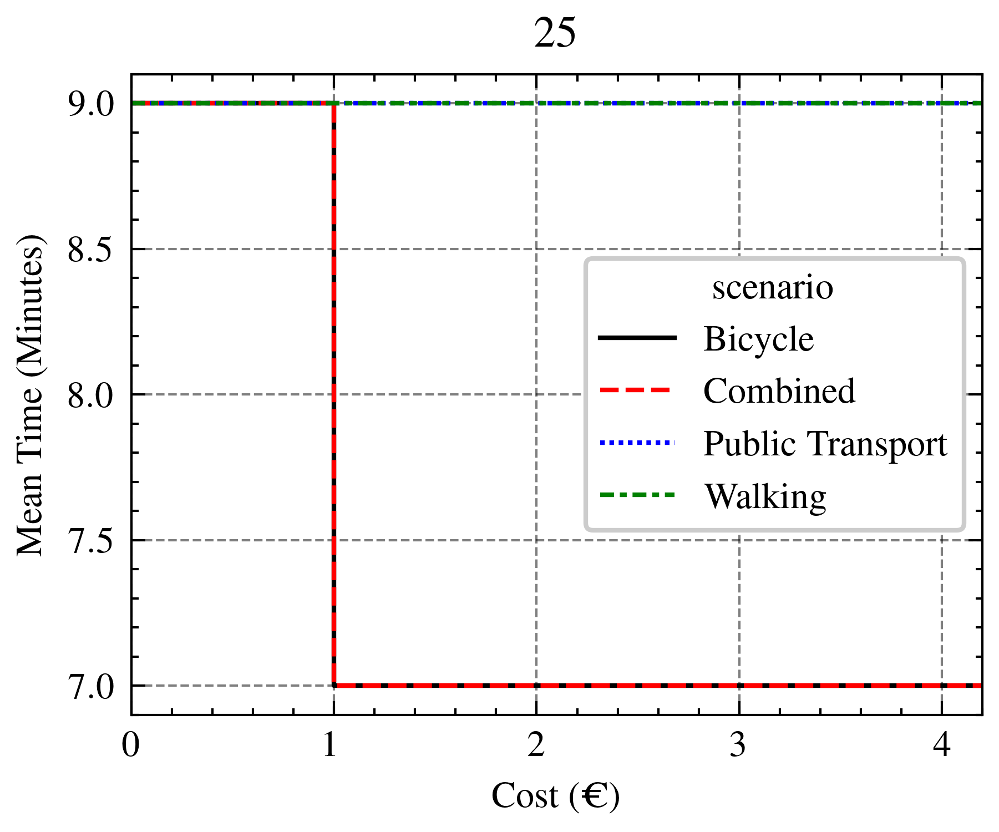

In [48]:
quantile_25_per_cost_per_scenario, maximum_time = get_aggregated_cost_per_scenario(
    no_inf_profiles_df, cost_columns, lambda x: x.quantile(0.25)
)
ax = sns.lineplot(
    data=quantile_25_per_cost_per_scenario.drop(columns="Car"), drawstyle="steps-post"
)
ax.set_xlim(0, mean_per_cost_per_scenario.index.max())
ax.set_title("25% Quantile Time per Cost for each Scenario")
ax.set_ylabel("Mean Time (Minutes)")
ax.set_xlabel("Cost (€)")


plt.savefig(
    f"{image_path}/quantile_25_time_per_cost_for_each_scenario_without_car.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

In [49]:
diffs_df = calculate_all_diffs(
    quantile_25_per_cost_per_scenario.drop(columns=["Car", "Combined"])
)
pretty_print_latex(
    diffs_df[
        ["improvement", "at_cost", "cost_diff", "minute_per_euro", "scenario"]
    ].sort_values("improvement", ascending=False),
    precision=3,
)
diffs_df

\begin{tabular}{lrrrrl}
 & improvement & at cost & cost diff & minute per euro & scenario \\
 & 2.000 & 1.000 & 1.000 & 2.000 & Bicycle \\
\end{tabular}



/tmp/ipykernel_31429/713530145.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(replace_underscore)


,improvement,at_cost,for_time,cost_diff,minute_per_euro,euro_per_minute,scenario
0,2.0,1.0,7.0,1.0,2.0,0.5,Bicycle


In [50]:
profiles_df_tariffs[profiles_df_tariffs.scenario == "Combined"][
    "required_cost_for_optimal_in_euro"
].describe()

count    1782.000000
mean        0.928919
std         0.826441
min         0.000000
25%         0.285714
50%         0.857143
75%         1.171429
max         3.771429
Name: required_cost_for_optimal_in_euro, dtype: float64

-> fahhrad nützlich

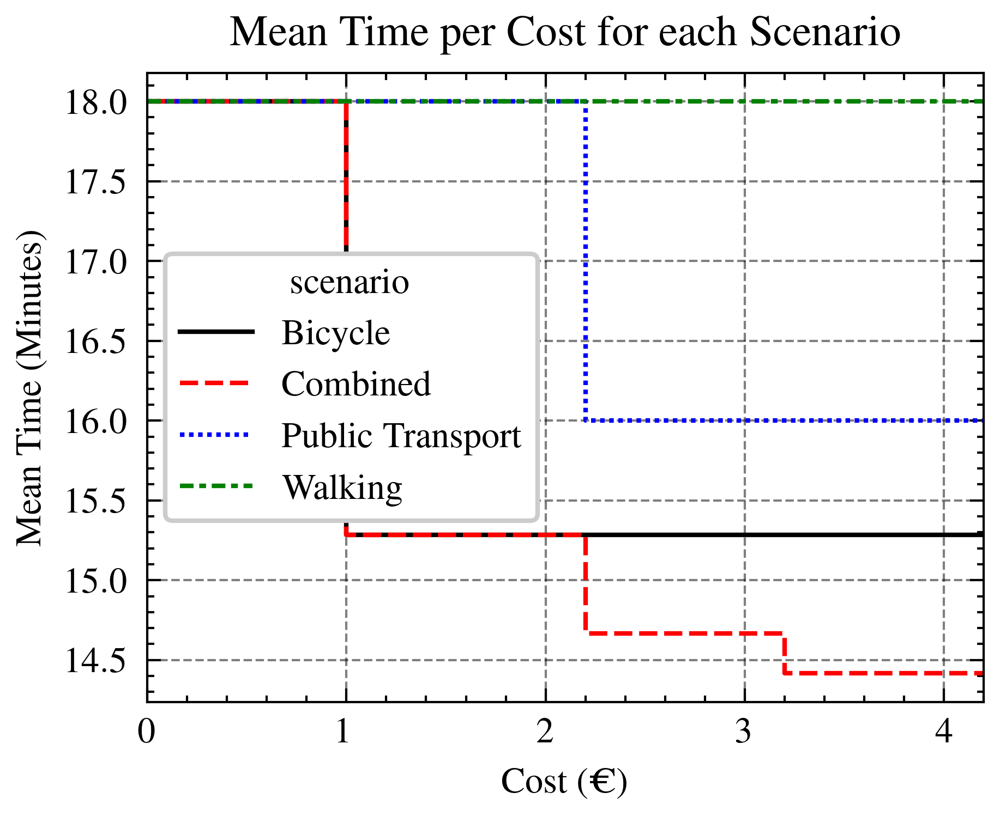

In [51]:
quantile_75_per_cost_per_scenario, maximum_time = get_aggregated_cost_per_scenario(
    no_inf_profiles_df, cost_columns, lambda x: x.quantile(0.75)
)
ax = sns.lineplot(
    data=quantile_75_per_cost_per_scenario.drop(columns="Car"), drawstyle="steps-post"
)
ax.set_xlim(0, mean_per_cost_per_scenario.index.max())
ax.set_title("Mean Time per Cost for each Scenario")
ax.set_ylabel("Mean Time (Minutes)")
ax.set_xlabel("Cost (€)")


plt.savefig(
    f"{image_path}/quantile_75_time_per_cost_for_each_scenario_without_car.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

In [52]:
diffs_df = calculate_all_diffs(
    quantile_75_per_cost_per_scenario.drop(columns=["Car", "Combined"])
)[["improvement", "at_cost", "cost_diff", "minute_per_euro", "scenario"]].sort_values(
    "improvement", ascending=False
)
pretty_print_latex(
    diffs_df,
    precision=3,
)
diffs_df

\begin{tabular}{lrrrrl}
 & improvement & at cost & cost diff & minute per euro & scenario \\
 & 2.714 & 1.000 & 1.000 & 2.714 & Bicycle \\
 & 2.000 & 2.200 & 2.200 & 0.909 & Public Transport \\
\end{tabular}



/tmp/ipykernel_31429/713530145.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(replace_underscore)


,improvement,at_cost,cost_diff,minute_per_euro,scenario
0,2.714286,1.0,1.0,2.714286,Bicycle
0,2.000000,2.2,2.2,0.909091,Public Transport


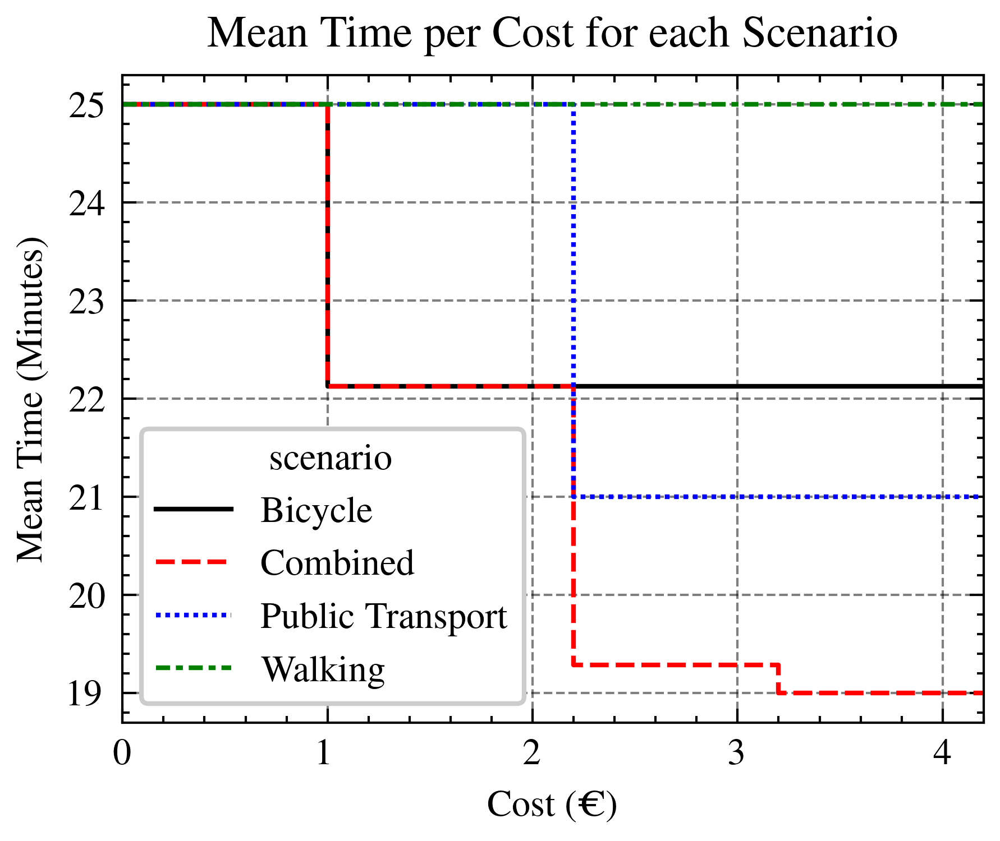

In [53]:
quantile_90_per_cost_per_scenario, maximum_time = get_aggregated_cost_per_scenario(
    no_inf_profiles_df, cost_columns, lambda x: x.quantile(0.90)
)
ax = sns.lineplot(
    data=quantile_90_per_cost_per_scenario.drop(columns="Car"), drawstyle="steps-post"
)
ax.set_xlim(0, mean_per_cost_per_scenario.index.max())
ax.set_title("Mean Time per Cost for each Scenario")
ax.set_ylabel("Mean Time (Minutes)")
ax.set_xlabel("Cost (€)")


plt.savefig(
    f"{image_path}/quantile_90_time_per_cost_for_each_scenario_without_car.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

In [54]:
diffs_df = calculate_all_diffs(
    quantile_90_per_cost_per_scenario.drop(columns=["Car", "Combined"])
)[["improvement", "at_cost", "cost_diff", "minute_per_euro", "scenario"]].sort_values(
    "improvement", ascending=False
)
pretty_print_latex(
    diffs_df,
    precision=3,
)
diffs_df

\begin{tabular}{lrrrrl}
 & improvement & at cost & cost diff & minute per euro & scenario \\
 & 4.000 & 2.200 & 2.200 & 1.818 & Public Transport \\
 & 2.871 & 1.000 & 1.000 & 2.871 & Bicycle \\
\end{tabular}



/tmp/ipykernel_31429/713530145.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(replace_underscore)


,improvement,at_cost,cost_diff,minute_per_euro,scenario
0,4.000000,2.2,2.2,1.818182,Public Transport
0,2.871429,1.0,1.0,2.871429,Bicycle


In [55]:
discretize_time = partial(
    pd.cut,
    bins=[0, 60 * 10, 60 * 15, 60 * 20, np.inf],
    labels=[
        "Under 10 Minutes",
        "Under 15 Minutes",
        "Under 20 Minutes",
        "Over 20 Minutes",
    ],
)

discrete_walking = discretize_time(
    profiles_df_tariffs[profiles_df_tariffs.scenario == "Walking"]
    .groupby(level=0)["optimal"]
    .mean()
)
discrete_pt_bike = discretize_time(
    profiles_df_tariffs[profiles_df_tariffs.scenario == "Combined"]
    .groupby(level=0)["optimal"]
    .mean()
)

In [56]:
profiles_df_tariffs[profiles_df_tariffs.scenario != "Car"].groupby(level=0)[
    "required_cost_for_optimal_in_euro"
].mean().max()

1.9333333333333336

In [57]:
hex_cost = (
    profiles_df_tariffs[profiles_df_tariffs.scenario == "Combined"]
    .groupby(level=0)["required_cost_for_optimal_in_euro"]
    .mean()
)
discrete_hex_costs = pd.cut(
    hex_cost,
    [-1, 0.01, 0.5, 1, 1.5, 2],
    labels=[
        "0 Euro",
        "0,50 Euro",
        "1 Euro",
        "1,50 Euro",
        "2 Euro",
    ],
)

In [58]:
from PIL import Image


def convert_map_png(folium_map, file_name):
    htmlfile = f"../tmp/figures/{file_name}.html"
    pdffile = f"../tmp/figures/{file_name}.pdf"
    pngfile = f"../figures/mcr5/{city}_{date}/{file_name}.png"

    # Get HTML File of Map
    folium_map.save(htmlfile)

    # Convert Map from HTML to PDF, Delay to Allow Rendering
    options = {
        "javascript-delay": 500,
        "page-size": "Letter",
        "margin-top": "0.0in",
        "margin-right": "0.0in",
        "margin-bottom": "0.0in",
        "margin-left": "0.0in",
        "encoding": "UTF-8",
        "custom-header": [("Accept-Encoding", "gzip")],
    }
    pdfkit.from_file(htmlfile, (pdffile), options=options)

    # Convert Map from PDF to PNG
    doc = fitz.open(pdffile)
    page = doc.load_page(0)
    pix = page.get_pixmap()
    pix.save(pngfile)
    doc.close()

    # Crop Out Map Image
    pilImage = Image.open(pngfile)

    # croppedImage = pilImage.crop(
    #     (20, 100, 550, 740)
    # )  # Adjust this if your map renders differently on PDF
    # croppedImage.save(pngfile)

    return pilImage

In [59]:
discrete_walking.value_counts() / discrete_walking.shape[0]

optimal
Under 10 Minutes    0.383781
Under 15 Minutes    0.284980
Over 20 Minutes     0.181611
Under 20 Minutes    0.149629
Name: count, dtype: float64

In [60]:
discrete_pt_bike.value_counts() / discrete_pt_bike.shape[0]

optimal
Under 10 Minutes    0.491582
Under 15 Minutes    0.289562
Under 20 Minutes    0.143098
Over 20 Minutes     0.075758
Name: count, dtype: float64

In [61]:
temp = (
    profiles_df_tariffs[profiles_df_tariffs.scenario == "Walking"]
    .groupby(level=0)["optimal"]
    .mean()
)
temp[temp > 20 * 60].median() / 60

26.0

In [62]:
import seaborn as sns

palette = sns.color_palette("muted")
palette

[(0.2823529411764706, 0.47058823529411764, 0.8156862745098039),
 (0.9333333333333333, 0.5215686274509804, 0.2901960784313726),
 (0.41568627450980394, 0.8, 0.39215686274509803),
 (0.8392156862745098, 0.37254901960784315, 0.37254901960784315),
 (0.5843137254901961, 0.4235294117647059, 0.7058823529411765),
 (0.5490196078431373, 0.3803921568627451, 0.23529411764705882),
 (0.8627450980392157, 0.49411764705882355, 0.7529411764705882),
 (0.4745098039215686, 0.4745098039215686, 0.4745098039215686),
 (0.8352941176470589, 0.7333333333333333, 0.403921568627451),
 (0.5098039215686274, 0.7764705882352941, 0.8862745098039215)]

### Plotting optimal on map

In [63]:
create_map = partial(
    folium.Map,
    location=geo_meta.get_center_lat_lon(),
    tiles="https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
    attr="Carto",
    zoom_start=12,
    height=1500,
    width=1000,
)

m = create_map()


def seconds_to_minutes(seconds):
    return seconds / 60


map_legend_opts = {
    "show_legend": True,
    # "legend_value_callback": seconds_to_minutes,
    "legend_caption": "Minutes",
}

plot_h3_discrete_map = partial(
    plot_h3_cells_discrete_colors_on_folium,
    color_scheme={
        "Under 10 Minutes": "green",
        "Under 15 Minutes": "yellow",
        "Under 20 Minutes": "orange",
        "Over 20 Minutes": "red",
    },
    fill_opacity=0.6,
)

plot_h3_modes = partial(
    plot_h3_cells_discrete_colors_on_folium,
    color_scheme={
        "Walking": "blue",
        "Bicycle": "yellow",
        "Public Transport": "red",
        "Combined": "orange",
    },
    fill_opacity=0.6,
)

plot_h3_discrete_map(discrete_walking.to_dict(), m)
m
# convert_map_png(m, "15_minute_map_walking")

In [64]:
m = create_map()
# plot_h3_cells_on_folium(
#     profiles_df[profiles_df["scenario"] == "Public Transport"]["optimal"].to_dict(),
#     m,
#     color="red",
#     popup_callback=lambda x: strtime.seconds_to_str_time(int(x)),
#     **map_legend_opts,
# )
plot_h3_discrete_map(
    discrete_pt_bike.to_dict(),
    m,
)
m
# convert_map_png(m, "15_minute_map")

In [65]:
pre_group = (
    profiles_df_tariffs[profiles_df_tariffs.scenario != "Car"]
    .reset_index()
    .groupby(["hex_id", "scenario"])
    .mean()
    .reset_index()
)
pre_group["scenario_cat"] = pd.Categorical(
    pre_group["scenario"],
    categories=["Walking", "Bicycle", "Public Transport", "Combined"],
    ordered=True,
)
pre_group = pre_group.sort_values(by="scenario_cat")
fastest_mode_per_hex = pre_group.loc[
    pre_group.groupby(["hex_id"]).optimal.idxmin()
].set_index(["hex_id"])

m = create_map()
plot_h3_modes(fastest_mode_per_hex["scenario_cat"].to_dict(), m)
m
# convert_map_png(m, "fastest_mode_per_hex")

In [66]:
m = folium.Map(location=geo_meta.get_center_lat_lon(), zoom_start=12)
plot_h3_cells_on_folium(
    profiles_df[profiles_df["scenario"] == "Walking"]["optimal"].to_dict(),
    m,
    color="red",
    popup_callback=lambda x: strtime.seconds_to_str_time(int(x)),
    **map_legend_opts,
)
m

In [67]:
cost_map_opts = {
    "show_legend": True,
    "legend_caption": "Euro",
    "popup_callback": lambda x: f"{x:.2f}€",
    "maximum": 4,
}

In [68]:
m = folium.Map(location=geo_meta.get_center_lat_lon(), zoom_start=12)

# plot_stops(m, stops)
plot_h3_cells_on_folium(
    profiles_df[profiles_df.scenario == "Public Transport"]
    .groupby(level=0)["required_cost_for_optimal_in_euro"]
    .mean()
    .to_dict(),
    m,
    color="red",
    **cost_map_opts,
)
m

In [69]:
m = folium.Map(location=geo_meta.get_center_lat_lon(), zoom_start=12)

plot_h3_cells_on_folium(
    profiles_df[profiles_df.scenario == "Bicycle"]
    .groupby(level=0)["required_cost_for_optimal_in_euro"]
    .mean()
    .to_dict(),
    m,
    color="red",
    **cost_map_opts,
)
m

In [70]:
m = folium.Map(location=geo_meta.get_center_lat_lon(), zoom_start=12)

plot_h3_cells_on_folium(
    profiles_df[profiles_df.scenario == "Combined"]
    .groupby(level=0)["required_cost_for_optimal_in_euro"]
    .mean()
    .to_dict(),
    m,
    color="red",
    **cost_map_opts,
)
m

### Walking not best

In [71]:
profiles_optimal = profiles_df[["optimal", "scenario"]].pivot(columns="scenario")
profiles_optimal.columns = [
    "_".join(col).strip() if isinstance(col, tuple) else col
    for col in profiles_optimal.columns.values
]
profiles_optimal = profiles_optimal.drop(columns="optimal_Car")
profiles_optimal["overall_optimal"] = profiles_optimal.min(axis=1)

walking_best = profiles_optimal[
    profiles_optimal["overall_optimal"] == profiles_optimal["optimal_Walking"]
]
walking_not_best = profiles_optimal[
    profiles_optimal["overall_optimal"] != profiles_optimal["optimal_Walking"]
]

In [72]:
# m = folium.Map(location=geo_meta.get_center_lat_lon() , zoom_start=12)
# plot_h3_cells_on_folium(
#     walking_not_best["overall_optimal"].to_dict(),
#     m,
#     color="red",
#     popup_callback=lambda x: strtime.seconds_to_str_time(int(x)),
# )
# plot_h3_cells_on_folium(
# 	walking_best["overall_optimal"].to_dict(),
# 	m,
# 	color="green",
# 	popup_callback=lambda x: strtime.seconds_to_str_time(int(x)),
# )
# m

### Not reachable by 15 minutes walking

In [74]:
# MINUTES_15 = 15 * 60
# # MINUTES_15 = 10 * 60
# walking_below_15_mins = profiles_optimal[
#     profiles_optimal["optimal_Walking"] <= MINUTES_15
# ]
# walking_above_15_mins = profiles_optimal[
#     profiles_optimal["optimal_Walking"] > MINUTES_15
# ]


# but_only_bicycle_below_15_mins = walking_above_15_mins[
#     (walking_above_15_mins["optimal_Bicycle"] <= MINUTES_15)
#     & (walking_above_15_mins["optimal_Public Transport"] > MINUTES_15)
# ]
# but_only_public_transport_below_15_mins = walking_above_15_mins[
#     (walking_above_15_mins["optimal_Public Transport"] <= MINUTES_15)
#     & (walking_above_15_mins["optimal_Bicycle"] > MINUTES_15)
# ]
# but_both_below_15_mins = walking_above_15_mins[
#     (walking_above_15_mins["optimal_Public Transport"] <= MINUTES_15)
#     & (walking_above_15_mins["optimal_Bicycle"] <= MINUTES_15)
# ]
# but_only_bicycle_public_transport_below_15_mins = walking_above_15_mins[
#     (walking_above_15_mins["optimal_Public Transport"] > MINUTES_15)
#     & (walking_above_15_mins["optimal_Bicycle"] > MINUTES_15)
#     & (walking_above_15_mins["optimal_Combined"] <= MINUTES_15)
# ]
# not_reachable_below_15_mins = walking_above_15_mins[
#     walking_above_15_mins["overall_optimal"] > MINUTES_15
# ]

In [76]:
# print(
#     f"""
# len(walking_above_15_mins): {len(walking_above_15_mins)} ({len(walking_above_15_mins) / len(profiles_optimal) * 100:.2f}% of all hexagons)

# Of those above 15 mins:
# len(but_only_bicycle_below_15_mins): {len(but_only_bicycle_below_15_mins)} ({len(but_only_bicycle_below_15_mins) / len(walking_above_15_mins) * 100:.2f}%)
# len(but_only_public_transport_below_15_mins): {len(but_only_public_transport_below_15_mins)} ({len(but_only_public_transport_below_15_mins) / len(walking_above_15_mins) * 100:.2f}%)
# len(but_both_below_15_mins): {len(but_both_below_15_mins)} ({len(but_both_below_15_mins) / len(walking_above_15_mins) * 100:.2f}%)
# len(but_only_bicycle_public_transport_below_15_mins): {len(but_only_bicycle_public_transport_below_15_mins)} ({len(but_only_bicycle_public_transport_below_15_mins) / len(walking_above_15_mins) * 100:.2f}%)
# len(not_reachable_below_15_mins): {len(not_reachable_below_15_mins)} ({len(not_reachable_below_15_mins) / len(walking_above_15_mins) * 100:.2f}%)
# """
# )

kombination nicht einflussreich

In [77]:
# if not pd.concat(
#     [
#         walking_below_15_mins,
#         but_only_bicycle_below_15_mins,
#         but_only_public_transport_below_15_mins,
#         but_both_below_15_mins,
#         but_only_bicycle_public_transport_below_15_mins,
#         not_reachable_below_15_mins,
#     ]
# ).index.is_unique:
#     print("something is wrong - index is not unique")
# if (
#     len(walking_above_15_mins)
#     - (
#         len(but_only_bicycle_below_15_mins)
#         + len(but_only_public_transport_below_15_mins)
#         + len(but_both_below_15_mins)
#         + len(but_only_bicycle_public_transport_below_15_mins)
#         + len(not_reachable_below_15_mins)
#     )
#     != 0
# ):
#     print("something is wrong - not all cases are covered")

In [78]:
# m = folium.Map(location=geo_meta.get_center_lat_lon(), zoom_start=12)

# # maximum = not_reachable_below_15_mins["overall_optimal"].max()
# maximum = 60 * 20

# kwargs = {
#     "popup_callback": lambda x: strtime.seconds_to_str_time(int(x)),
#     "folium_map": m,
#     "maximum": maximum,
# }

# # geo_meta.add_to_folium_map(m)
# plot_h3_cells_on_folium(
#     walking_below_15_mins["optimal_Walking"].to_dict(), color="green", **kwargs
# )

# plot_h3_cells_on_folium(
#     pd.concat(
#         [
#             but_only_bicycle_below_15_mins["optimal_Bicycle"],
#             but_only_public_transport_below_15_mins["optimal_Public Transport"],
#             but_both_below_15_mins["optimal_Combined"],
#         ]
#     ).to_dict(),
#     color="yellow",
#     **kwargs,
# )
# plot_h3_cells_on_folium(
#     not_reachable_below_15_mins["overall_optimal"].to_dict(), color="red", **kwargs
# )

# m

In [79]:
# import geopandas as gpd

# stations = gpd.read_file(
#     "../data/stations.csv", GEOM_POSSIBLE_NAMES="geometry", KEEP_GEOM_COLUMNS="NO"
# )


# def plot_stations(m, stations):
#     for _, station in stations.iterrows():
#         folium.CircleMarker(
#             location=(station.geometry.y, station.geometry.x),
#             popup=station["station_name"],
#             radius=1,
#             color="black",
#         ).add_to(m)


# stations

In [80]:
# m = folium.Map(location=geo_meta.get_center_lat_lon(), zoom_start=12)

# maximum = 60 * 20

# kwargs = {
#     "popup_callback": lambda x: strtime.seconds_to_str_time(int(x)),
#     "folium_map": m,
#     "maximum": maximum,
# }

# # geo_meta.add_to_folium_map(m)
# plot_h3_cells_on_folium(
#     but_only_bicycle_below_15_mins["optimal_Bicycle"].to_dict(),
#     color="orange",
#     **kwargs,
# )

# plot_h3_cells_on_folium(
#     but_only_public_transport_below_15_mins["optimal_Public Transport"].to_dict(),
#     color="yellow",
#     **kwargs,
# )
# plot_h3_cells_on_folium(
#     but_both_below_15_mins["optimal_Combined"].to_dict(), color="green", **kwargs
# )

# # plot_stations(m, stations)
# # plot_zones(m, zones, datetime(2022, 8, 1, 12, 0, 0))
# plot_stops(m, stops)
# plot_bicycle_locations(m, all_bicycle_locations)

# m

In [81]:
# m = folium.Map(location=geo_meta.get_center_lat_lon(), zoom_start=12)

# maximum = 60 * 20

# kwargs = {
#     "popup_callback": lambda x: strtime.seconds_to_str_time(int(x)),
#     "folium_map": m,
#     "maximum": maximum,
# }

# # geo_meta.add_to_folium_map(m)

# plot_h3_cells_on_folium(
#     not_reachable_below_15_mins["optimal_Bicycle"].to_dict(), color="red", **kwargs
# )


# # plot_stations(m, stations)
# # plot_zones(m, zones, datetime(2022, 8, 1, 12, 0, 0))
# # plot_bicycle_locations(m, all_bicycle_locations)
# plot_stops(m, stops)

# m

In [82]:
# m = folium.Map(location=geo_meta.get_center_lat_lon(), zoom_start=12)

# maximum = 60 * 20

# kwargs = {
#     "popup_callback": lambda x: strtime.seconds_to_str_time(int(x)),
#     "folium_map": m,
#     "maximum": maximum,
# }

# # geo_meta.add_to_folium_map(m)

# plot_h3_cells_on_folium(
#     but_only_bicycle_public_transport_below_15_mins["optimal_Combined"].to_dict(),
#     color="green",
#     **kwargs,
# )

# # plot_stations(m, stations)
# # plot_zones(m, zones, datetime(2022, 8, 1, 12, 0, 0))
# # plot_bicycle_locations(m, all_bicycle_locations)
# # plot_stops(m, stops)

# m

### Calculating cost per month for each scenario


In [83]:
categories_df = (
    profiles_df_categories.drop(columns=["scenario"])
    .groupby(["hex_id", "category", "core_scenario"])
    .mean()
)

categories_df_tariffs = (
    profiles_df_categories_tariffs.drop(columns=["scenario"])
    .groupby(["hex_id", "category", "core_scenario"])
    .mean()
)


categories_df = categories_df.reset_index()
categories_df_tariffs = categories_df_tariffs.reset_index()
categories_df

,hex_id,category,core_scenario,any_column_different,required_cost_for_optimal,optimal,required_cost_for_optimal_in_euro,optimal_in_minutes,cost_0,cost_19,...,cost_76,cost_95,cost_100,cost_114,cost_133,cost_152,cost_200,cost_220,cost_320,cost_420
0,891fa181003ffff,banks,Bicycle,0.0,0.0,660.0,0.00,11.0,660.0,660.0,...,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0
1,891fa181003ffff,banks,Car,1.0,19.0,120.0,0.19,2.0,660.0,120.0,...,120.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0
2,891fa181003ffff,banks,Combined,0.0,0.0,660.0,0.00,11.0,660.0,660.0,...,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0
3,891fa181003ffff,banks,Public Transport,0.0,0.0,660.0,0.00,11.0,660.0,660.0,...,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0
4,891fa181003ffff,banks,Walking,0.0,0.0,660.0,0.00,11.0,660.0,660.0,...,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0,660.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61280,891fa56592fffff,sustenance,Bicycle,0.0,0.0,300.0,0.00,5.0,300.0,300.0,...,300.0,300.0,300.0,300.0,300.0,300.0,300.0,300.0,300.0,300.0
61281,891fa56592fffff,sustenance,Car,1.0,19.0,120.0,0.19,2.0,300.0,120.0,...,120.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0
61282,891fa56592fffff,sustenance,Combined,0.0,0.0,300.0,0.00,5.0,300.0,300.0,...,300.0,300.0,300.0,300.0,300.0,300.0,300.0,300.0,300.0,300.0
61283,891fa56592fffff,sustenance,Public Transport,0.0,0.0,300.0,0.00,5.0,300.0,300.0,...,300.0,300.0,300.0,300.0,300.0,300.0,300.0,300.0,300.0,300.0


In [84]:
categories_df.category.unique()

array(['banks', 'education', 'grocery', 'health', 'parks', 'shops',
       'sustenance'], dtype=object)

In [85]:
groceries_per_month = 3 * 4
education_per_month = 5 * 4
health_per_month = 5.09 / 12
banks_per_month = 9
parks_per_month = 29 / 12
sustenance_per_month = 6.12
shops_per_month = 4

visits_per_month_dict = {
    "grocery": groceries_per_month,
    "education": education_per_month,
    "health": health_per_month,
    "banks": banks_per_month,
    "parks": parks_per_month,
    "sustenance": sustenance_per_month,
    "shops": shops_per_month,
}
visits_per_month_dict

{'grocery': 12,
 'education': 20,
 'health': 0.42416666666666664,
 'banks': 9,
 'parks': 2.4166666666666665,
 'sustenance': 6.12,
 'shops': 4}

In [86]:
def calculate_costs_per_month_for_optimal(df):
    return df.apply(
        lambda x: x.required_cost_for_optimal * visits_per_month_dict[x.category],
        axis=1,
    )


categories_df["monthly_cost_for_optimal_in_euro"] = (
    calculate_costs_per_month_for_optimal(categories_df)
)

In [87]:
def retrieve_cost_for_sub_X_minute_city(row, X, cost_columns=cost_columns):
    for cost_column in cost_columns:
        if row[cost_column] <= X * 60:
            return int(cost_column.split("_")[1]) / 100
    return np.inf


def calculate_costs_per_month_for_sub_X_minute_city(
    df, minutes, cost_columns=cost_columns
):
    return df.apply(
        lambda row: retrieve_cost_for_sub_X_minute_city(row, minutes, cost_columns)
        * visits_per_month_dict[row.category],
        axis=1,
    )


COL_10 = "monthly_cost_for_sub_10_minute_city_in_euro"
COL_15 = "monthly_cost_for_sub_15_minute_city_in_euro"
categories_df[COL_10] = calculate_costs_per_month_for_sub_X_minute_city(
    categories_df, 10
)
categories_df[COL_15] = calculate_costs_per_month_for_sub_X_minute_city(
    categories_df, 15
)
categories_df_tariffs[COL_10] = calculate_costs_per_month_for_sub_X_minute_city(
    categories_df_tariffs, 10, cost_columns_tariffs
)

categories_df_tariffs[COL_15] = calculate_costs_per_month_for_sub_X_minute_city(
    categories_df_tariffs, 15, cost_columns_tariffs
)


SUB_X_COLS = [COL_10, COL_15]

In [88]:
def pivot_dataframe_inf_percentage(df, column_name):
    selected_columns = df[["category", "core_scenario", column_name]]

    grouped = (
        selected_columns.groupby(["category", "core_scenario"])
        .apply(lambda x: (x[column_name] == np.inf).mean())
        .reset_index(name="percentage_inf")
    )

    pivoted = grouped.pivot(
        index="category", columns="core_scenario", values="percentage_inf"
    )

    return pivoted

In [89]:
def plot_matrix_as_heatmap(matrix, ax=None, sort_column=True, sort_row=True, **kwargs):
    if ax is None:
        fig, ax = plt.subplots(figsize=(7, 3))

    if "annot" not in kwargs:
        kwargs["annot"] = True
    if "fmt" not in kwargs:
        kwargs["fmt"] = ".2f"

    if sort_row:
        matrix["avg"] = matrix.mean(axis=1)
        matrix = matrix.sort_values("avg", ascending=False).drop(columns="avg")

    if sort_column:
        correct_order = matrix.mean(axis=0).sort_values(ascending=False).index
        matrix = matrix[correct_order]

    ax = sns.heatmap(
        matrix,
        ax=ax,
        **kwargs,
    )

    plt.xticks(rotation=20, ha="right")
    return ax

#### reachable in X minutes

In [90]:
# original_scenarios = profiles_df_categories.core_scenario.unique()

In [91]:
SUSTAINABLE_MODES = ["Bicycle", "Public Transport", "Combined"]

In [92]:
categories_ptb = categories_df[categories_df["core_scenario"] == "Combined"]
categories_ptb_worst = categories_ptb.loc[
    categories_ptb.groupby(["hex_id"])["optimal_in_minutes"].idxmax()
]
categories_ptb_worst["category"].value_counts() / len(categories_ptb_worst)

category
banks         0.433467
parks         0.408338
health        0.077670
education     0.052541
sustenance    0.017704
grocery       0.007995
shops         0.002284
Name: count, dtype: float64

In [93]:
for visit in visits_per_month_dict:
    categories_ptb.loc[categories_ptb.category == visit, "optimal_in_minutes"] *= (
        visits_per_month_dict[visit]
    )
    categories_ptb.loc[
        categories_ptb.category == visit, "required_cost_for_optimal_in_euro"
    ] *= visits_per_month_dict[visit]

In [94]:
aggregated_categories_ptb = categories_ptb.groupby("hex_id").sum()

In [129]:
thresholds = [5 * 54, 10 * 54, 15 * 54, 20 * 54]
thresholds_cost = [1, 20, 40, 60]

In [132]:
for threshold in thresholds:
    print(
        threshold,
        (aggregated_categories_ptb["Monthly Travel Time"] < threshold).sum()
        / len(aggregated_categories_ptb),
    )

270 0.3066818960593946
540 0.8812107367218732
810 0.9788692175899486
1080 0.9937178754997145


In [133]:
for threshold in thresholds_cost:
    print(
        threshold,
        (aggregated_categories_ptb["Monthly Cost"] < threshold).sum()
        / len(aggregated_categories_ptb),
    )

1 0.22330097087378642
20 0.6727584237578527
40 0.9183323814962878
60 0.9754426042261565


<Axes: ylabel='Density'>

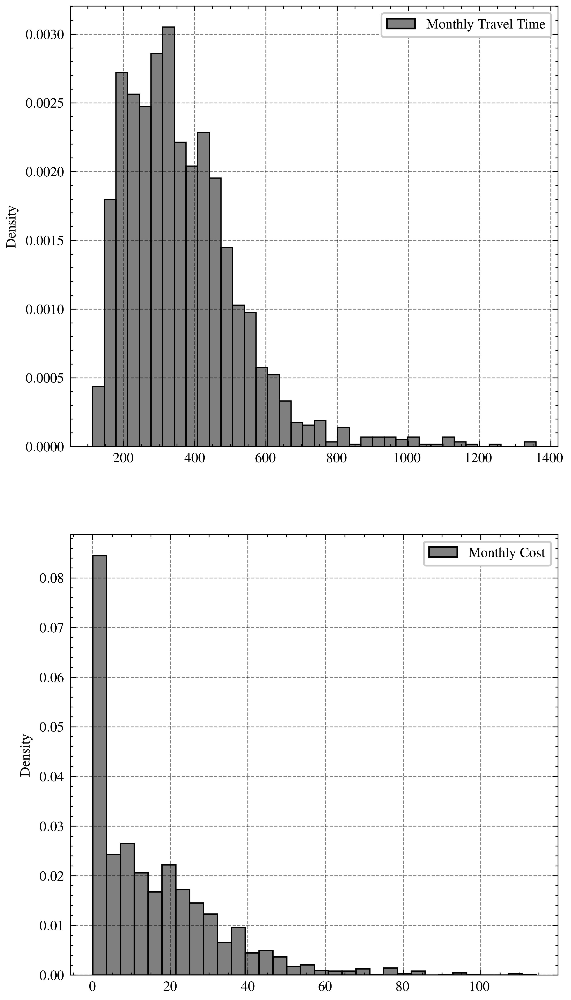

In [116]:
aggregated_categories_ptb = aggregated_categories_ptb.rename(
    columns={
        "optimal_in_minutes": "Monthly Travel Time",
        "required_cost_for_optimal_in_euro": "Monthly Cost",
    }
)
fig, axes = plt.subplots(2, 1, figsize=(5, 10))
sns.histplot(
    aggregated_categories_ptb[["Monthly Travel Time"]],
    stat="density",
    ax=axes[0],
    color="blue",
)
sns.histplot(
    aggregated_categories_ptb[["Monthly Cost"]],
    stat="density",
    ax=axes[1],
    color="orange",
)

In [147]:
labels_time = [f"Under {value} Minutes" for value in thresholds] + [
    f"Over {thresholds[-1]} Minutes"
]
discrete_hex_aggregate_time = pd.cut(
    aggregated_categories_ptb["Monthly Travel Time"],
    [0] + thresholds + [np.inf],
    labels=labels_time,
)
labels_cost = [f"Under {value} Euro" for value in thresholds_cost] + [
    f"Over {thresholds_cost[-1]} Euro"
]
discrete_hex_aggregate_cost = pd.cut(
    aggregated_categories_ptb["Monthly Cost"],
    [-1] + thresholds_cost + [np.inf],
    labels=labels_cost,
)

In [148]:
m = create_map()
plot_h3_cells_discrete_colors_on_folium(
    discrete_hex_aggregate_time.to_dict(),
    m,
    color_scheme={
        label: color
        for label, color in zip(
            labels_time, ["green", "yellow", "orange", "red", "darkred"]
        )
    },
)
m

In [149]:
m = create_map()
plot_h3_cells_discrete_colors_on_folium(
    discrete_hex_aggregate_cost.to_dict(),
    m,
    color_scheme={
        label: color
        for label, color in zip(
            labels_cost, ["green", "yellow", "orange", "red", "darkred"]
        )
    },
)
m

In [84]:
categories_ptb_15 = categories_df[
    (categories_df["core_scenario"] == "Combined")
    & (categories_df["optimal_in_minutes"] > 15)
]
categories_ptb_worst = categories_ptb_15.loc[
    categories_ptb_15.groupby(["hex_id"])["optimal_in_minutes"].idxmax()
]
categories_ptb_worst["category"].value_counts()

category
parks        198
banks        157
health        27
education      3
shops          1
Name: count, dtype: int64

In [95]:
categories_ptb_15 = categories_df[
    (categories_df["core_scenario"] == "Combined")
    & (categories_df["optimal_in_minutes"] > 20)
]
categories_ptb_worst = categories_ptb_15.loc[
    categories_ptb_15.groupby(["hex_id"])["optimal_in_minutes"].idxmax()
]
categories_ptb_worst["category"].value_counts()

category
banks        56
parks        56
health       19
education     1
Name: count, dtype: int64

In [85]:
hex_df = pd.DataFrame()
hex_df["hex_id"] = categories_ptb.hex_id.unique()
hex_df.set_index("hex_id", inplace=True)

In [86]:
hex_df["n>10"] = (
    categories_ptb[categories_ptb["optimal_in_minutes"] > 10]
    .groupby(["hex_id"])
    .nunique()["category"]
)
hex_df["n>15"] = (
    categories_ptb[categories_ptb["optimal_in_minutes"] > 15]
    .groupby(["hex_id"])
    .nunique()["category"]
)
hex_df["n>20"] = (
    categories_ptb[categories_ptb["optimal_in_minutes"] > 20]
    .groupby(["hex_id"])
    .nunique()["category"]
)
hex_df = hex_df.fillna(0)

In [87]:
hex_df = hex_df.sort_values(by="n>10")

(array([868., 349., 194.,   0., 137.,  77.,   0.,  48.,  36.,  42.]),
 array([0. , 0.7, 1.4, 2.1, 2.8, 3.5, 4.2, 4.9, 5.6, 6.3, 7. ]),
 <BarContainer object of 10 artists>)

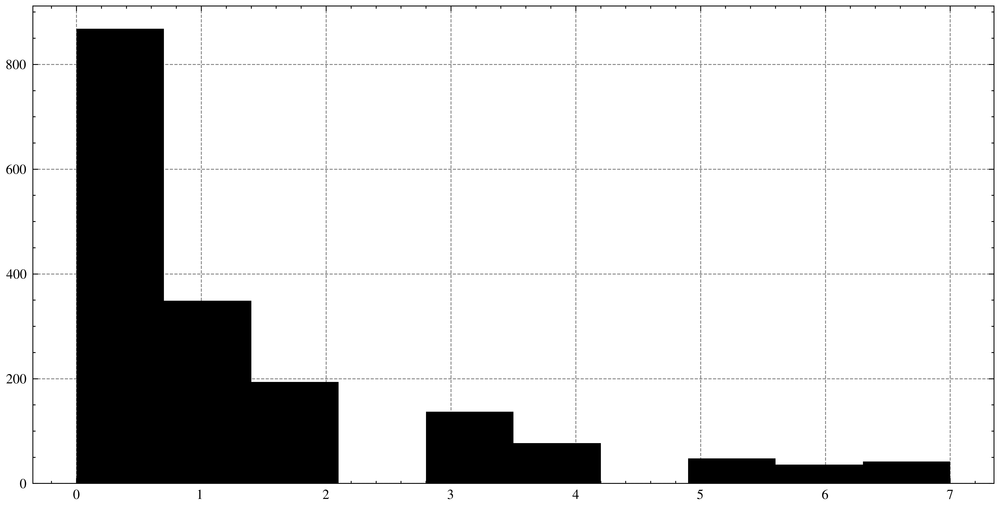

In [104]:
plt.figure(figsize=(10, 5))
plt.hist(hex_df["n>10"].sort_values().reset_index(drop=True))

In [104]:
m = folium.Map(location=geo_meta.get_center_lat_lon(), zoom_start=12)
plot_h3_cells_on_folium(
    hex_df["n>20"].to_dict(),
    m,
    color="red",
    popup_callback=lambda x: strtime.seconds_to_str_time(int(x)),
    **map_legend_opts,
)
m

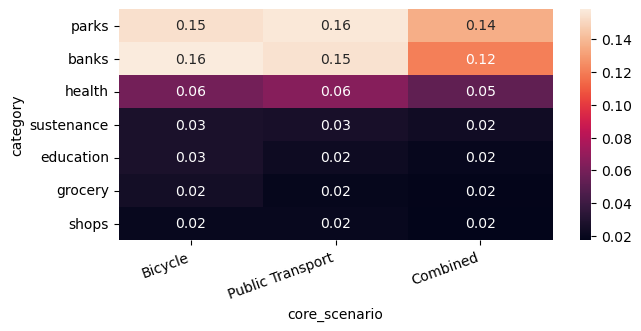

In [81]:
plot_matrix_as_heatmap(
    pivot_dataframe_inf_percentage(categories_df, COL_15)[SUSTAINABLE_MODES]
)
os.makedirs("../figures/results/monthly_costs", exist_ok=True)
plt.savefig(
    "../figures/results/monthly_costs/percentage_inf_15.png",
    dpi=300,
    bbox_inches="tight",
)

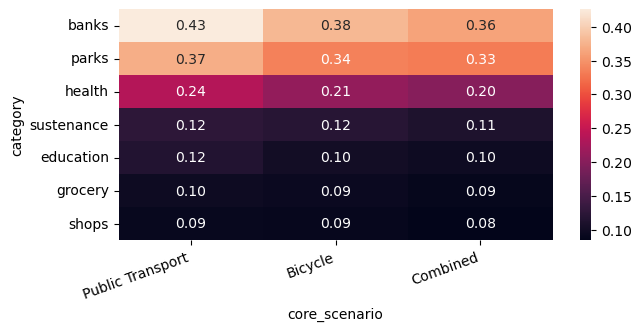

In [82]:
plot_matrix_as_heatmap(
    pivot_dataframe_inf_percentage(categories_df, COL_10)[SUSTAINABLE_MODES]
)
plt.savefig(
    "../figures/results/monthly_costs/percentage_inf_10.png",
    dpi=300,
    bbox_inches="tight",
)

In [83]:
# categories_df_no_inf = categories_df[
#     np.isinf(categories_df[SUB_X_COLS]).sum(axis=1) == 0
# ]

In [84]:
INTERESTING_DESCRIBE_COLUMNS = ["mean", "std", "min", "25%", "50%", "75%", "max"]


def describe_by_category(df, column_name):
    selected_columns = df[["category", "core_scenario", column_name]]
    grouped = selected_columns.groupby(["category"]).describe()
    grouped.columns = grouped.columns.droplevel(level=0)
    grouped = grouped[INTERESTING_DESCRIBE_COLUMNS]

    return grouped


def describe_by_scenario(df, column_name):
    selected_columns = df[["category", "core_scenario", column_name]]
    grouped = selected_columns.groupby(["core_scenario"]).describe()
    grouped.columns = grouped.columns.droplevel(level=0)
    grouped = grouped[INTERESTING_DESCRIBE_COLUMNS]

    return grouped

#### cost per category per month for reachable

In [85]:
# categories_df_no_inf_original = categories_df_no_inf[
# 	categories_df_no_inf.core_scenario.isin(original_scenarios)
# ]

In [86]:
# describe_by_category(categories_df_no_inf_original, COL_15).sort_values("mean", ascending=False)

In [87]:
# describe_by_category(categories_df_no_inf_original, COL_10).sort_values("mean", ascending=False)

In [88]:
def pivot_dataframe_mean(df, column_name):
    selected_columns = df[["category", "core_scenario", column_name]]
    grouped = (
        selected_columns.groupby(["category", "core_scenario"]).mean().reset_index()
    )
    pivoted = grouped.pivot(
        index="category", columns="core_scenario", values=column_name
    )
    return pivoted

In [89]:
# plot_matrix_as_heatmap(
#     pivot_dataframe_mean(categories_df_no_inf, COL_10)
# )
# plt.savefig(
#     "../figures/results/monthly_costs/cost_sub_10.png", dpi=300, bbox_inches="tight"
# )

In [90]:
# plot_matrix_as_heatmap(pivot_dataframe_mean(categories_df_no_inf, COL_15))
# plt.savefig(
#     "../figures/results/monthly_costs/cost_sub_15.png", dpi=300, bbox_inches="tight"
# )

#### cost per category per month for reachable by all (more comparable)

In [91]:
def filter_categories_by_threshold(df, threshold):
    category_hex_reachable_in_threshold = (
        df.groupby(["hex_id", "category"])["optimal_in_minutes"].max() <= threshold
    )
    index = category_hex_reachable_in_threshold[
        category_hex_reachable_in_threshold
    ].index

    df_filtered = df.set_index(["hex_id", "category"]).loc[index]

    filter_missing_index = (
        df_filtered.reset_index()
        .groupby(["hex_id", "category"])["core_scenario"]
        .size()
        == df["core_scenario"].nunique()
    )
    filter_missing_index = filter_missing_index[filter_missing_index].index

    result = df_filtered.loc[filter_missing_index]

    return result.reset_index()

In [92]:
scenarios_cost_0_equal = [
    "bicycle",
    "bicycle_public_transport",
    "public_transport",
    "walking",
]

df_filter = categories_df[categories_df["core_scenario"].isin(scenarios_cost_0_equal)]
problematic = df_filter.groupby(["hex_id", "category"]).apply(
    lambda x: x["cost_0"].nunique() > 1
)
problematic_index = problematic[problematic].index

In [93]:
fixed_categories_df = (
    categories_df.set_index(["hex_id", "category"])
    .drop(index=problematic_index)
    .reset_index()
)

In [94]:
# hex_ids_reachable_in_10_mins = (
#     fixed_categories_df.groupby(["hex_id", "category"])["optimal_in_minutes"].max()
#     <= 10
# )
# hex_ids_reachable_in_15_mins = (
#     fixed_categories_df.groupby(["hex_id", "category"])["optimal_in_minutes"].max()
#     <= 15
# )

categories_df_all_reachable_in_15 = filter_categories_by_threshold(
    fixed_categories_df, 15
)
categories_df_all_reachable_in_10 = filter_categories_by_threshold(
    fixed_categories_df, 10
)

In [95]:
describe_by_category(categories_df_all_reachable_in_15, COL_15).sort_values(
    "mean", ascending=False
)

,mean,std,min,25%,50%,75%,max
category,,,,,,,
education,0.009935,0.568801,0.0,0.0,0.0,0.0,44.000000
health,0.000667,0.021460,0.0,0.0,0.0,0.0,0.933167
banks,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000
grocery,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000
parks,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000
shops,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000
sustenance,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000


In [96]:
describe_by_category(categories_df_all_reachable_in_10, COL_10).sort_values(
    "mean", ascending=False
)

,mean,std,min,25%,50%,75%,max
category,,,,,,,
grocery,0.019397,0.615424,0.0,0.0,0.0,0.0,26.400000
education,0.011060,0.600135,0.0,0.0,0.0,0.0,44.000000
banks,0.007891,0.340041,0.0,0.0,0.0,0.0,19.800000
parks,0.003777,0.121872,0.0,0.0,0.0,0.0,5.316667
sustenance,0.003416,0.184493,0.0,0.0,0.0,0.0,13.464000
shops,0.002148,0.118288,0.0,0.0,0.0,0.0,8.800000
health,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000


In [97]:
no_walking_categories_df = fixed_categories_df[
    (fixed_categories_df["core_scenario"] != "Walking")
    & (fixed_categories_df["core_scenario"] != "Car")
]

In [98]:
categories_df_all_reachable_in_15 = filter_categories_by_threshold(
    no_walking_categories_df, 15
)
categories_df_all_reachable_in_10 = filter_categories_by_threshold(
    no_walking_categories_df, 10
)

In [99]:
# describe_by_category(categories_df_all_reachable_in_15, COL_15).sort_values(
#     "mean", ascending=False
# )

In [100]:
# describe_by_category(categories_df_all_reachable_in_10, COL_10).sort_values(
#     "mean", ascending=False
# )

In [101]:
# describe_by_scenario(categories_df_all_reachable_in_15, COL_15).sort_values(
#     "mean", ascending=False
# )

In [102]:
# describe_by_scenario(categories_df_all_reachable_in_10, COL_10).sort_values(
#     "mean", ascending=False
# )

In [103]:
# plot_matrix_as_heatmap(
#     pivot_dataframe_mean(categories_df_all_reachable_in_10, COL_10)
# )
# plt.savefig(
#     "../figures/results/monthly_costs/cost_all_reachable_in_10.png",
#     dpi=300,
#     bbox_inches="tight",
# )

In [104]:
# plot_matrix_as_heatmap(pivot_dataframe_mean(categories_df_all_reachable_in_15, COL_15))

# plt.savefig(
#     "../figures/results/monthly_costs/cost_all_reachable_in_15.png",
#     dpi=300,
#     bbox_inches="tight",
# )

In [105]:
def is_all_zero(group):
    return (group == 0).all()


def where_one_is_not_zero(df, col):
    all_zero = df.groupby(["hex_id", "category"])[col].apply(is_all_zero) == False
    one_not_zero_index = all_zero[all_zero].index
    return df.set_index(["hex_id", "category"]).loc[one_not_zero_index].reset_index()

<Axes: xlabel='core_scenario', ylabel='category'>

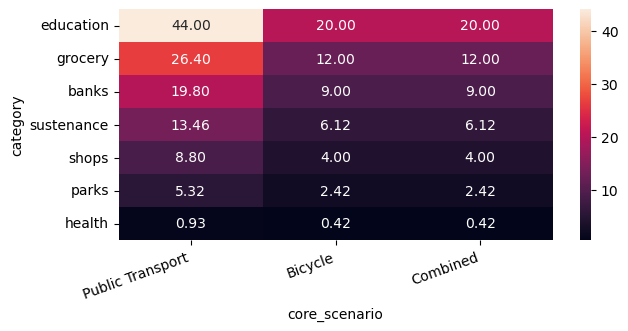

In [106]:
plot_matrix_as_heatmap(
    pivot_dataframe_mean(
        where_one_is_not_zero(categories_df_all_reachable_in_10, COL_10), COL_10
    )
)
# plt.savefig(
#     "../figures/results/monthly_costs/cost_all_reachable_in_10.png",
#     dpi=300,
#     bbox_inches="tight",
# )

<Axes: xlabel='core_scenario', ylabel='category'>

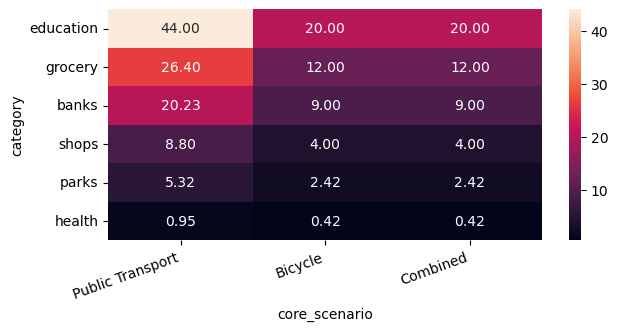

In [107]:
plot_matrix_as_heatmap(
    pivot_dataframe_mean(
        where_one_is_not_zero(categories_df_all_reachable_in_15, COL_15), COL_15
    )
)
# plt.savefig(
#     "../figures/results/monthly_costs/cost_all_reachable_in_10.png",
#     dpi=300,
#     bbox_inches="tight",
# )

In [108]:
where_one_is_not_zero(categories_df_all_reachable_in_10, COL_10)

,hex_id,category,core_scenario,any_column_different,required_cost_for_optimal,optimal,required_cost_for_optimal_in_euro,optimal_in_minutes,cost_0,cost_19,...,cost_100,cost_114,cost_133,cost_200,cost_220,cost_320,cost_420,monthly_cost_for_optimal_in_euro,monthly_cost_for_sub_10_minute_city_in_euro,monthly_cost_for_sub_15_minute_city_in_euro
0,891fa181043ffff,grocery,Bicycle,0.750000,75.000000,390.0,0.750000,6.500000,660.0,660.0,...,390.0,390.0,390.0,390.0,390.0,390.0,390.0,900.000000,12.000000,0.0
1,891fa181043ffff,grocery,Combined,0.916667,111.666667,365.0,1.116667,6.083333,660.0,660.0,...,390.0,390.0,390.0,390.0,365.0,365.0,365.0,1340.000000,12.000000,0.0
2,891fa181043ffff,grocery,Public Transport,0.666667,146.666667,560.0,1.466667,9.333333,660.0,660.0,...,660.0,660.0,660.0,660.0,560.0,560.0,560.0,1760.000000,26.400000,0.0
3,891fa181043ffff,shops,Bicycle,0.750000,75.000000,390.0,0.750000,6.500000,660.0,660.0,...,390.0,390.0,390.0,390.0,390.0,390.0,390.0,300.000000,4.000000,0.0
4,891fa181043ffff,shops,Combined,0.916667,111.666667,365.0,1.116667,6.083333,660.0,660.0,...,390.0,390.0,390.0,390.0,365.0,365.0,365.0,446.666667,4.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130,891fa199b43ffff,parks,Combined,1.000000,130.000000,480.0,1.300000,8.000000,780.0,780.0,...,510.0,510.0,510.0,510.0,480.0,480.0,480.0,314.166667,2.416667,0.0
131,891fa199b43ffff,parks,Public Transport,1.000000,220.000000,600.0,2.200000,10.000000,780.0,780.0,...,780.0,780.0,780.0,780.0,600.0,600.0,600.0,531.666667,5.316667,0.0
132,891fa199bc3ffff,health,Bicycle,0.750000,75.000000,510.0,0.750000,8.500000,660.0,660.0,...,510.0,510.0,510.0,510.0,510.0,510.0,510.0,31.812500,0.424167,0.0
133,891fa199bc3ffff,health,Combined,1.000000,130.000000,495.0,1.300000,8.250000,660.0,660.0,...,510.0,510.0,510.0,510.0,495.0,495.0,495.0,55.141667,0.424167,0.0


In [109]:
def get_total_monthly_cost_by_scenario_where_not_null(df, col):
    total_monthly_cost = df.groupby(["hex_id", "core_scenario"])[col].sum()
    total_monthly_cost = total_monthly_cost[total_monthly_cost != 0].reset_index()

    return total_monthly_cost

In [110]:
total_monthly_cost_by_scenario_where_not_null_15 = (
    get_total_monthly_cost_by_scenario_where_not_null(
        categories_df_all_reachable_in_15, COL_15
    )
)
table = total_monthly_cost_by_scenario_where_not_null_15.groupby("core_scenario")[
    COL_15
].describe()[INTERESTING_DESCRIBE_COLUMNS]
table.index.name = "Scenario"
styled_table = table.style.format("{:.2f}")
print(styled_table.to_latex())
styled_table

\begin{tabular}{lrrrrrrr}
 & mean & std & min & 25% & 50% & 75% & max \\
Scenario &  &  &  &  &  &  &  \\
Bicycle & 5.79 & 5.95 & 0.42 & 0.42 & 4.00 & 9.00 & 29.00 \\
Combined & 5.79 & 5.95 & 0.42 & 0.42 & 4.00 & 9.00 & 29.00 \\
Public Transport & 12.93 & 13.26 & 0.93 & 0.93 & 8.80 & 19.80 & 63.80 \\
\end{tabular}



,mean,std,min,25%,50%,75%,max
Scenario,,,,,,,
Bicycle,5.79,5.95,0.42,0.42,4.00,9.00,29.00
Combined,5.79,5.95,0.42,0.42,4.00,9.00,29.00
Public Transport,12.93,13.26,0.93,0.93,8.80,19.80,63.80


In [111]:
total_monthly_cost_by_scenario_where_not_null_10 = (
    get_total_monthly_cost_by_scenario_where_not_null(
        categories_df_all_reachable_in_10, COL_10
    )
)
table = total_monthly_cost_by_scenario_where_not_null_10.groupby("core_scenario")[
    COL_10
].describe()[INTERESTING_DESCRIBE_COLUMNS]
table.index.name = "Scenario"
styled_table = table.style.format("{:.2f}")
print(styled_table.to_latex())
styled_table

\begin{tabular}{lrrrrrrr}
 & mean & std & min & 25% & 50% & 75% & max \\
Scenario &  &  &  &  &  &  &  \\
Bicycle & 10.49 & 7.72 & 0.42 & 2.42 & 9.00 & 20.00 & 24.54 \\
Combined & 10.49 & 7.72 & 0.42 & 2.42 & 9.00 & 20.00 & 24.54 \\
Public Transport & 23.08 & 16.98 & 0.93 & 5.32 & 19.80 & 44.00 & 53.98 \\
\end{tabular}



,mean,std,min,25%,50%,75%,max
Scenario,,,,,,,
Bicycle,10.49,7.72,0.42,2.42,9.00,20.00,24.54
Combined,10.49,7.72,0.42,2.42,9.00,20.00,24.54
Public Transport,23.08,16.98,0.93,5.32,19.80,44.00,53.98


In [112]:
index_15 = total_monthly_cost_by_scenario_where_not_null_15.set_index(
    ["hex_id"]
).index.unique()
car_categories_df = fixed_categories_df[fixed_categories_df["core_scenario"] == "Car"]
series = (
    car_categories_df.groupby(["hex_id", "core_scenario"])[COL_15]
    .sum()
    .reset_index()
    .set_index(["hex_id"])
    .loc[index_15][COL_15]
    .describe()
)
series.name = "Car (15 Minutes)"
car_15 = series.to_frame().T

In [113]:
index_10 = total_monthly_cost_by_scenario_where_not_null_10.set_index(
    ["hex_id"]
).index.unique()
car_categories_df = fixed_categories_df[fixed_categories_df["core_scenario"] == "Car"]
series = (
    car_categories_df.groupby(["hex_id", "core_scenario"])[COL_10]
    .sum()
    .reset_index()
    .set_index(["hex_id"])
    .loc[index_10][COL_10]
    .describe()
)
series.name = "Car (10 Minutes)"
car_10 = series.to_frame().T

In [114]:
car_table = pd.concat([car_15, car_10])[INTERESTING_DESCRIBE_COLUMNS]
styled_table = car_table.style.format("{:.2f}")
print(styled_table.to_latex())
styled_table

\begin{tabular}{lrrrrrrr}
 & mean & std & min & 25% & 50% & 75% & max \\
Car (15 Minutes) & 1.79 & 1.69 & 0.00 & 0.46 & 1.71 & 1.79 & 7.00 \\
Car (10 Minutes) & 2.87 & 2.89 & 0.00 & 0.46 & 1.79 & 3.91 & 10.88 \\
\end{tabular}



,mean,std,min,25%,50%,75%,max
Car (15 Minutes),1.79,1.69,0.00,0.46,1.71,1.79,7.00
Car (10 Minutes),2.87,2.89,0.00,0.46,1.79,3.91,10.88


## Runtime

In [115]:
import pickle as pkl

with open("../data/mcr5/Koeln-rerun/runtimes.pkl", "rb") as f:
    runtimes = pkl.load(f)

runtimes_df = pd.DataFrame(runtimes)
runtimes_df["total"] = runtimes_df.sum(axis=1)
runtimes_df = runtimes_df.T
runtimes_df

,load_time,run_time,total_time
bicycle_public_transport_0,0 days 00:03:24.109548,0 days 00:09:33.703996,0 days 00:12:57.813550
bicycle_public_transport_1,0 days 00:03:28.463569,0 days 00:10:39.584577,0 days 00:14:08.048154
bicycle_public_transport_2,0 days 00:03:39.790187,0 days 00:11:21.459661,0 days 00:15:01.249854
bicycle_public_transport_3,0 days 00:03:40.953237,0 days 00:10:14.556371,0 days 00:13:55.509614
bicycle_public_transport_4,0 days 00:03:42.982565,0 days 00:13:34.734428,0 days 00:17:17.717001
bicycle_public_transport_5,0 days 00:03:47.436711,0 days 00:14:01.114047,0 days 00:17:48.550765
bicycle_public_transport_6,0 days 00:03:44.130023,0 days 00:13:50.069501,0 days 00:17:34.199531
bicycle_public_transport_7,0 days 00:03:50.047097,0 days 00:13:27.679555,0 days 00:17:17.726659
bicycle_public_transport_8,0 days 00:03:45.922852,0 days 00:15:18.583090,0 days 00:19:04.505949
bicycle_public_transport_9,0 days 00:03:46.887818,0 days 00:15:29.856261,0 days 00:19:16.744087


In [116]:
# drop total row
runtimes_df = runtimes_df.drop(index="total")
runtimes_df

,load_time,run_time,total_time
bicycle_public_transport_0,0 days 00:03:24.109548,0 days 00:09:33.703996,0 days 00:12:57.813550
bicycle_public_transport_1,0 days 00:03:28.463569,0 days 00:10:39.584577,0 days 00:14:08.048154
bicycle_public_transport_2,0 days 00:03:39.790187,0 days 00:11:21.459661,0 days 00:15:01.249854
bicycle_public_transport_3,0 days 00:03:40.953237,0 days 00:10:14.556371,0 days 00:13:55.509614
bicycle_public_transport_4,0 days 00:03:42.982565,0 days 00:13:34.734428,0 days 00:17:17.717001
bicycle_public_transport_5,0 days 00:03:47.436711,0 days 00:14:01.114047,0 days 00:17:48.550765
bicycle_public_transport_6,0 days 00:03:44.130023,0 days 00:13:50.069501,0 days 00:17:34.199531
bicycle_public_transport_7,0 days 00:03:50.047097,0 days 00:13:27.679555,0 days 00:17:17.726659
bicycle_public_transport_8,0 days 00:03:45.922852,0 days 00:15:18.583090,0 days 00:19:04.505949
bicycle_public_transport_9,0 days 00:03:46.887818,0 days 00:15:29.856261,0 days 00:19:16.744087


In [117]:
def get_core_scenario(scenario):
    return "_".join(scenario.split("_")[:-1])


runtimes_df["core_scenario"] = runtimes_df.index.map(get_core_scenario)
runtimes_df

,load_time,run_time,total_time,core_scenario
bicycle_public_transport_0,0 days 00:03:24.109548,0 days 00:09:33.703996,0 days 00:12:57.813550,bicycle_public_transport
bicycle_public_transport_1,0 days 00:03:28.463569,0 days 00:10:39.584577,0 days 00:14:08.048154,bicycle_public_transport
bicycle_public_transport_2,0 days 00:03:39.790187,0 days 00:11:21.459661,0 days 00:15:01.249854,bicycle_public_transport
bicycle_public_transport_3,0 days 00:03:40.953237,0 days 00:10:14.556371,0 days 00:13:55.509614,bicycle_public_transport
bicycle_public_transport_4,0 days 00:03:42.982565,0 days 00:13:34.734428,0 days 00:17:17.717001,bicycle_public_transport
bicycle_public_transport_5,0 days 00:03:47.436711,0 days 00:14:01.114047,0 days 00:17:48.550765,bicycle_public_transport
bicycle_public_transport_6,0 days 00:03:44.130023,0 days 00:13:50.069501,0 days 00:17:34.199531,bicycle_public_transport
bicycle_public_transport_7,0 days 00:03:50.047097,0 days 00:13:27.679555,0 days 00:17:17.726659,bicycle_public_transport
bicycle_public_transport_8,0 days 00:03:45.922852,0 days 00:15:18.583090,0 days 00:19:04.505949,bicycle_public_transport
bicycle_public_transport_9,0 days 00:03:46.887818,0 days 00:15:29.856261,0 days 00:19:16.744087,bicycle_public_transport


In [118]:
runtimes_df.groupby("core_scenario").mean()

,load_time,run_time,total_time
core_scenario,,,
,0 days 00:02:13.841985500,0 days 00:16:47.005495,0 days 00:19:00.847486500
bicycle,0 days 00:03:46.730007250,0 days 00:16:36.421216250,0 days 00:20:23.151231750
bicycle_public_transport,0 days 00:03:41.587843666,0 days 00:13:07.628967083,0 days 00:16:49.216817750
public_transport,0 days 00:01:46.869578333,0 days 00:14:52.527628333,0 days 00:16:39.397213


In [120]:
runtimes_df.groupby("core_scenario").sum().sum()

load_time    0 days 01:09:14.266859
run_time     0 days 05:02:08.826345
total_time   0 days 06:11:23.093352
dtype: timedelta64[ns]